In [1]:
from scipy.io import arff
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
import xgboost as xgb
from sklearn.metrics import accuracy_score, f1_score, roc_auc_score
from sklearn.model_selection import train_test_split
import os
from sklearn.model_selection import cross_val_score

# Preprocessing

In [2]:
data = pd.read_csv('./data/electricity/electricity.csv', sep = ',')    

In [4]:
data.loc[data['stabf'] == 'unstable', 'stabf'] = 1
data.loc[data['stabf'] == 'stable', 'stabf'] = 0

In [5]:
data.stabf.value_counts()

1    6380
0    3620
Name: stabf, dtype: int64

In [6]:
data.shape

(10000, 14)

In [7]:
data_cols = list(data.columns[ data.columns != 'stabf' ])
label_cols = ['stabf']

In [6]:
#Standardize columns
data[data_cols] = StandardScaler().fit(data[data_cols]).transform(data[data_cols])
data[label_cols] = data[label_cols].astype('int')

In [6]:
def xgbo_cv(X,y):
    xg_reg = xgb.XGBClassifier(object="binary:logistic")    
    print('Accuracy XGBoost CV:  '+ np.str(cross_val_score(xg_reg, X,y, cv=5, scoring='accuracy', n_jobs=-1).mean()))
    print('F1-Score XGBoost CV:  '+ np.str(cross_val_score(xg_reg, X,y, cv=5, scoring='f1', n_jobs=-1).mean()))
    print('ROC AUC XGBoost CV:  '+ np.str(cross_val_score(xg_reg, X,y, cv=5, scoring = 'roc_auc', n_jobs=-1).mean()))

# GAN setup and training

In [16]:
import CGAN

# For reloading after making changes
import importlib
importlib.reload(CGAN) 
from CGAN import *


rand_dim = 100 
base_n_count = 30

nb_steps = 50000+1 # 50000 # Add one for logging of the last interval
batch_size = 64 

k_d = 1  # number of critic network updates per adversarial training step
k_g = 1  # number of generator network updates per adversarial training step
critic_pre_train_steps = 100 # number of steps to pre-train the critic before starting adversarial training
log_interval = 100   # interval (in steps) at which to log loss summaries and save plots of image samples to disc
learning_rate = 5e-5 # 5e-5
data_dir = './cache/electricity/'
generator_model_path, discriminator_model_path, loss_pickle_path = None, None, None

show = True 

train = data.copy().reset_index(drop=True)

train[ data_cols ] = train[ data_cols ] / 10 # scale to random noise size, one less thing to learn
train_no_label = train[ data_cols ]

Using TensorFlow backend.


data_dim:  13
data_cols:  ['tau1', 'tau2', 'tau3', 'tau4', 'p1', 'p2', 'p3', 'p4', 'g1', 'g2', 'g3', 'g4', 'stab']
label_dim:  1
label_cols:  ['stabf']
Instructions for updating:
Colocations handled automatically by placer.
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 100)          0                                            
__________________________________________________________________________________________________
input_2 (InputLayer)            (None, 1)            0                                            
__________________________________________________________________________________________________
concatenate_1 (Concatenate)     (None, 101)          0           input_1[0][0]                    
                                                                 input_2[0][0]     

C:\Programas\Anaconda3\lib\site-packages\keras\engine\training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


Instructions for updating:
Use tf.cast instead.
Step: 0 of 50001.
Losses: G, D Gen, D Real: 0.6451, 0.7407, 0.6609
D Real - D Gen: -0.0798


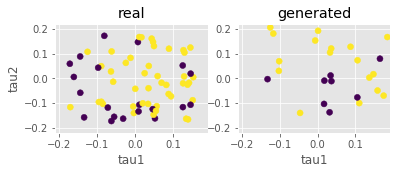

Step: 100 of 50001.
Losses: G, D Gen, D Real: 0.7020, 0.6720, 0.6508
D Real - D Gen: -0.0212


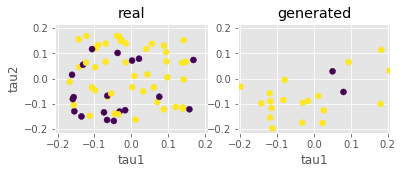

Step: 200 of 50001.
Losses: G, D Gen, D Real: 0.6817, 0.7014, 0.6619
D Real - D Gen: -0.0395


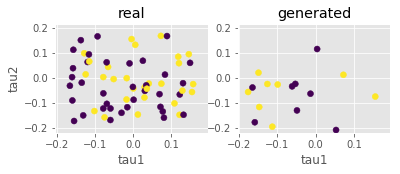

Step: 300 of 50001.
Losses: G, D Gen, D Real: 0.6323, 0.7402, 0.6524
D Real - D Gen: -0.0879


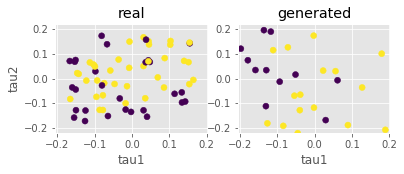

Step: 400 of 50001.
Losses: G, D Gen, D Real: 0.6679, 0.7138, 0.6609
D Real - D Gen: -0.0529


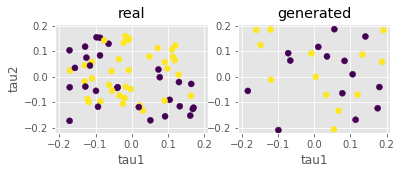

Step: 500 of 50001.
Losses: G, D Gen, D Real: 0.7157, 0.6693, 0.6706
D Real - D Gen: 0.0013


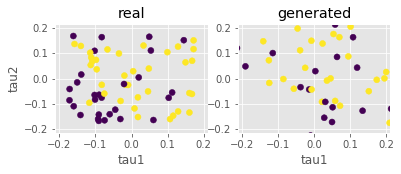

Step: 600 of 50001.
Losses: G, D Gen, D Real: 0.6920, 0.6740, 0.6636
D Real - D Gen: -0.0104


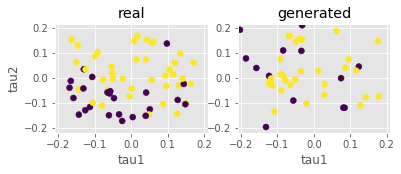

Step: 700 of 50001.
Losses: G, D Gen, D Real: 0.6745, 0.6750, 0.6594
D Real - D Gen: -0.0156


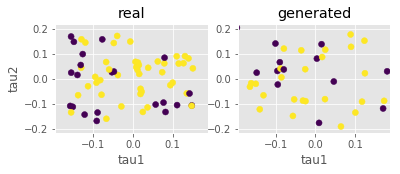

Step: 800 of 50001.
Losses: G, D Gen, D Real: 0.6972, 0.6838, 0.6611
D Real - D Gen: -0.0227


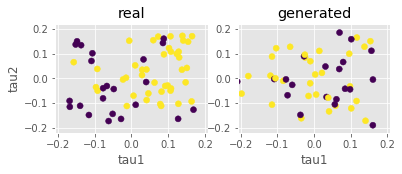

Step: 900 of 50001.
Losses: G, D Gen, D Real: 0.6771, 0.6792, 0.6548
D Real - D Gen: -0.0244


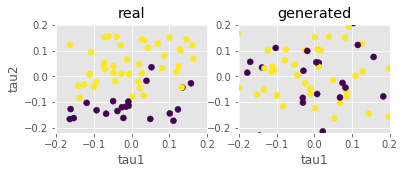

Step: 1000 of 50001.
Losses: G, D Gen, D Real: 0.6815, 0.6780, 0.6636
D Real - D Gen: -0.0144


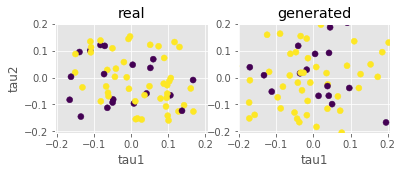

Step: 1100 of 50001.
Losses: G, D Gen, D Real: 0.7038, 0.6746, 0.6698
D Real - D Gen: -0.0048


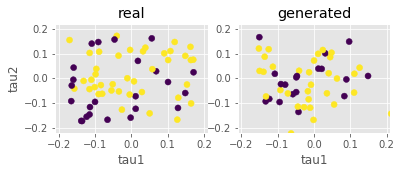

Step: 1200 of 50001.
Losses: G, D Gen, D Real: 0.6709, 0.6780, 0.6528
D Real - D Gen: -0.0252


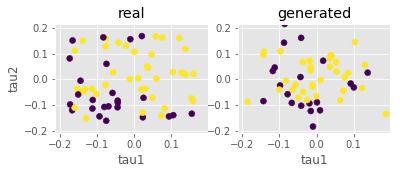

Step: 1300 of 50001.
Losses: G, D Gen, D Real: 0.6794, 0.6789, 0.6573
D Real - D Gen: -0.0216


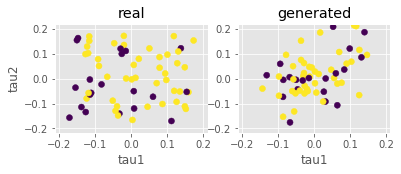

Step: 1400 of 50001.
Losses: G, D Gen, D Real: 0.6833, 0.6816, 0.6566
D Real - D Gen: -0.0250


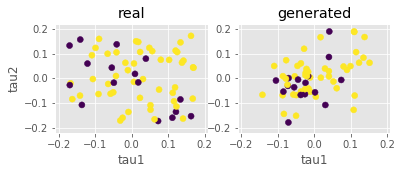

Step: 1500 of 50001.
Losses: G, D Gen, D Real: 0.6861, 0.6822, 0.6547
D Real - D Gen: -0.0275


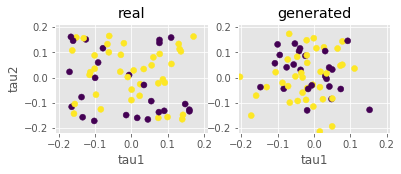

Step: 1600 of 50001.
Losses: G, D Gen, D Real: 0.7034, 0.6967, 0.6498
D Real - D Gen: -0.0469


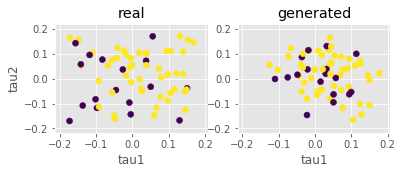

Step: 1700 of 50001.
Losses: G, D Gen, D Real: 0.6770, 0.6836, 0.6497
D Real - D Gen: -0.0339


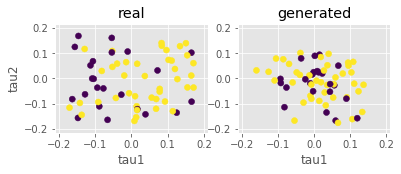

Step: 1800 of 50001.
Losses: G, D Gen, D Real: 0.6708, 0.6813, 0.6478
D Real - D Gen: -0.0335


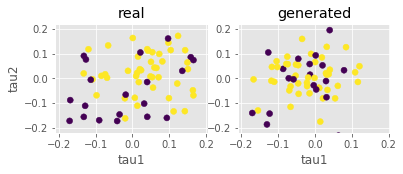

Step: 1900 of 50001.
Losses: G, D Gen, D Real: 0.6913, 0.6615, 0.6479
D Real - D Gen: -0.0136


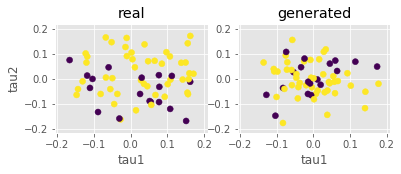

Step: 2000 of 50001.
Losses: G, D Gen, D Real: 0.6959, 0.6611, 0.6313
D Real - D Gen: -0.0298


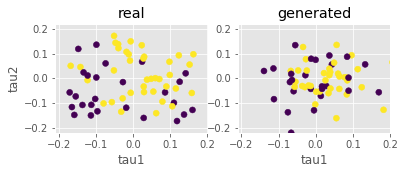

Step: 2100 of 50001.
Losses: G, D Gen, D Real: 0.6963, 0.7152, 0.6484
D Real - D Gen: -0.0669


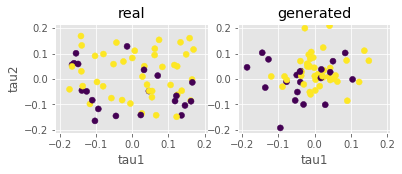

Step: 2200 of 50001.
Losses: G, D Gen, D Real: 0.7218, 0.7031, 0.6541
D Real - D Gen: -0.0490


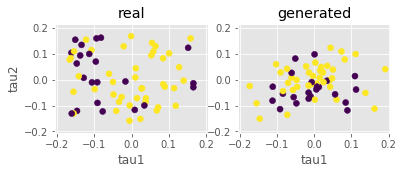

Step: 2300 of 50001.
Losses: G, D Gen, D Real: 0.6792, 0.6860, 0.6317
D Real - D Gen: -0.0544


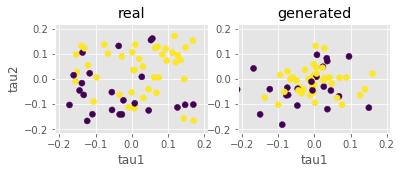

Step: 2400 of 50001.
Losses: G, D Gen, D Real: 0.7040, 0.6982, 0.6364
D Real - D Gen: -0.0618


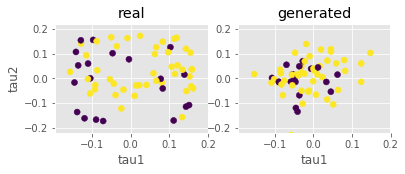

Step: 2500 of 50001.
Losses: G, D Gen, D Real: 0.7549, 0.6743, 0.6447
D Real - D Gen: -0.0296


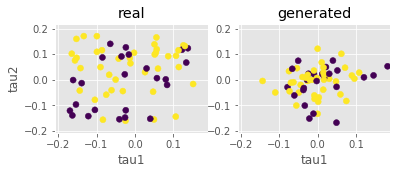

Step: 2600 of 50001.
Losses: G, D Gen, D Real: 0.6979, 0.6767, 0.6358
D Real - D Gen: -0.0408


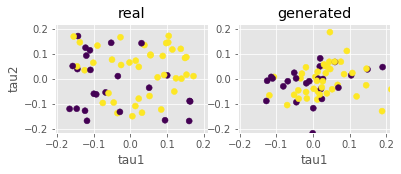

Step: 2700 of 50001.
Losses: G, D Gen, D Real: 0.7006, 0.7045, 0.6327
D Real - D Gen: -0.0718


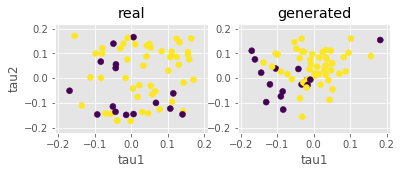

Step: 2800 of 50001.
Losses: G, D Gen, D Real: 0.6689, 0.6577, 0.6288
D Real - D Gen: -0.0289


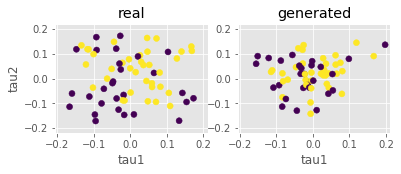

Step: 2900 of 50001.
Losses: G, D Gen, D Real: 0.6871, 0.6570, 0.6401
D Real - D Gen: -0.0169


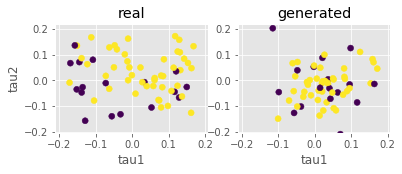

Step: 3000 of 50001.
Losses: G, D Gen, D Real: 0.7014, 0.7012, 0.6335
D Real - D Gen: -0.0678


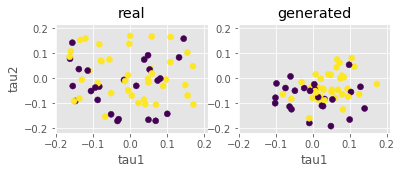

Step: 3100 of 50001.
Losses: G, D Gen, D Real: 0.6933, 0.6558, 0.6350
D Real - D Gen: -0.0207


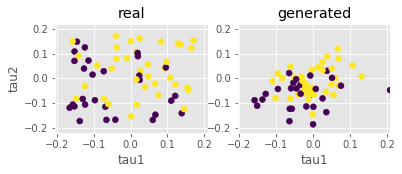

Step: 3200 of 50001.
Losses: G, D Gen, D Real: 0.7040, 0.6367, 0.6427
D Real - D Gen: 0.0060


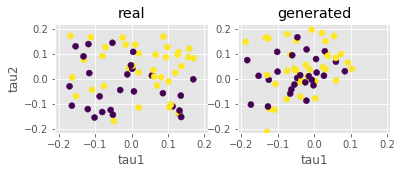

Step: 3300 of 50001.
Losses: G, D Gen, D Real: 0.6869, 0.6632, 0.6236
D Real - D Gen: -0.0397


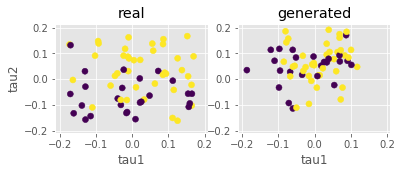

Step: 3400 of 50001.
Losses: G, D Gen, D Real: 0.6746, 0.6924, 0.6203
D Real - D Gen: -0.0722


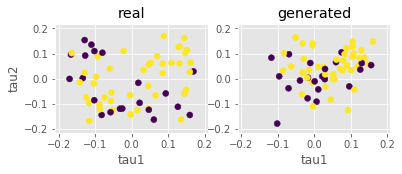

Step: 3500 of 50001.
Losses: G, D Gen, D Real: 0.7328, 0.6474, 0.6021
D Real - D Gen: -0.0453


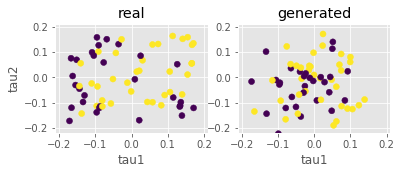

Step: 3600 of 50001.
Losses: G, D Gen, D Real: 0.7250, 0.6791, 0.6196
D Real - D Gen: -0.0595


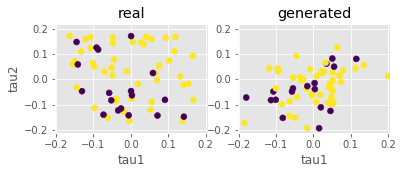

Step: 3700 of 50001.
Losses: G, D Gen, D Real: 0.6688, 0.6745, 0.6275
D Real - D Gen: -0.0470


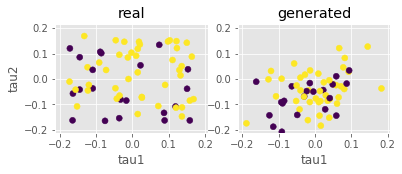

Step: 3800 of 50001.
Losses: G, D Gen, D Real: 0.7496, 0.6545, 0.6344
D Real - D Gen: -0.0201


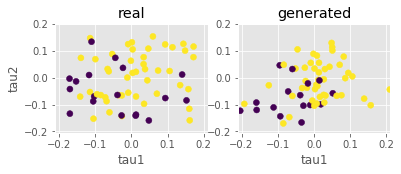

Step: 3900 of 50001.
Losses: G, D Gen, D Real: 0.6257, 0.5913, 0.6465
D Real - D Gen: 0.0551


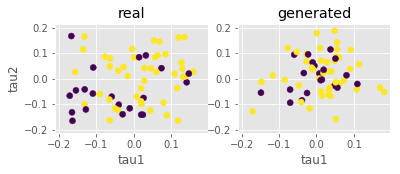

Step: 4000 of 50001.
Losses: G, D Gen, D Real: 0.6954, 0.6701, 0.6255
D Real - D Gen: -0.0446


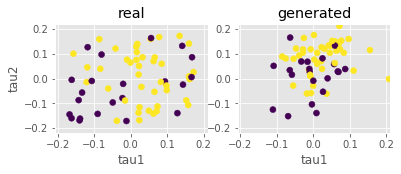

Step: 4100 of 50001.
Losses: G, D Gen, D Real: 0.7112, 0.6836, 0.6039
D Real - D Gen: -0.0798


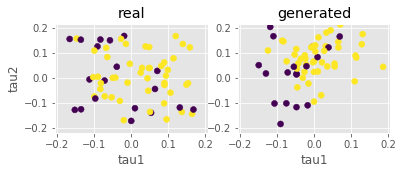

Step: 4200 of 50001.
Losses: G, D Gen, D Real: 0.6358, 0.6586, 0.5812
D Real - D Gen: -0.0774


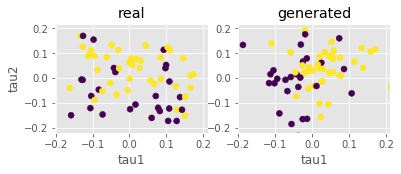

Step: 4300 of 50001.
Losses: G, D Gen, D Real: 0.6575, 0.6873, 0.5941
D Real - D Gen: -0.0932


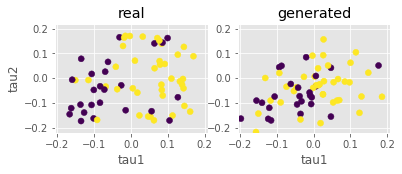

Step: 4400 of 50001.
Losses: G, D Gen, D Real: 0.7944, 0.7026, 0.6032
D Real - D Gen: -0.0993


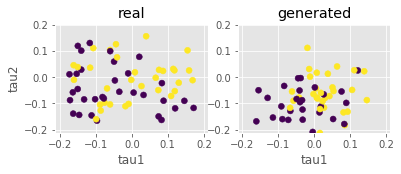

Step: 4500 of 50001.
Losses: G, D Gen, D Real: 0.7167, 0.5793, 0.6252
D Real - D Gen: 0.0459


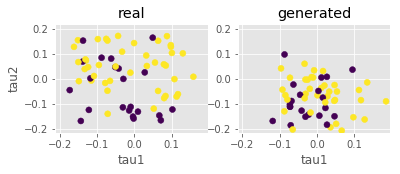

Step: 4600 of 50001.
Losses: G, D Gen, D Real: 0.7084, 0.5740, 0.6497
D Real - D Gen: 0.0757


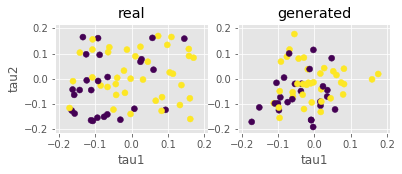

Step: 4700 of 50001.
Losses: G, D Gen, D Real: 0.8147, 0.6777, 0.6154
D Real - D Gen: -0.0624


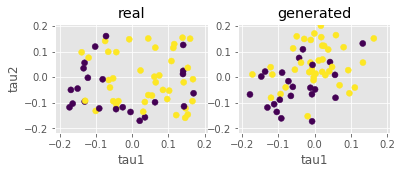

Step: 4800 of 50001.
Losses: G, D Gen, D Real: 0.5626, 0.6953, 0.6170
D Real - D Gen: -0.0784


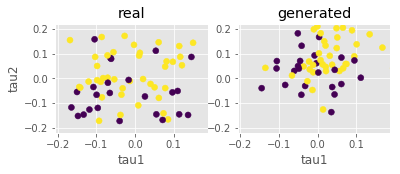

Step: 4900 of 50001.
Losses: G, D Gen, D Real: 0.6984, 0.6330, 0.6073
D Real - D Gen: -0.0257


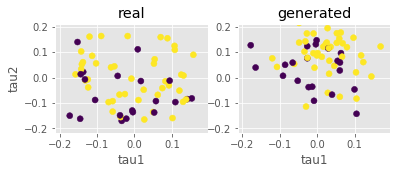

Step: 5000 of 50001.
Losses: G, D Gen, D Real: 0.8847, 0.6344, 0.5630
D Real - D Gen: -0.0714


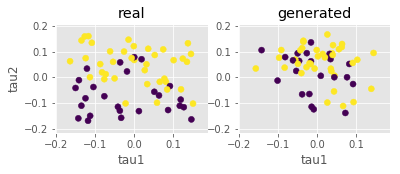

Step: 5100 of 50001.
Losses: G, D Gen, D Real: 0.5614, 0.6319, 0.5852
D Real - D Gen: -0.0466


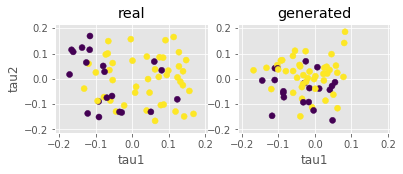

Step: 5200 of 50001.
Losses: G, D Gen, D Real: 0.5904, 0.7027, 0.5916
D Real - D Gen: -0.1111


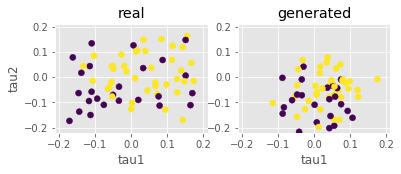

Step: 5300 of 50001.
Losses: G, D Gen, D Real: 0.5520, 0.5956, 0.6273
D Real - D Gen: 0.0317


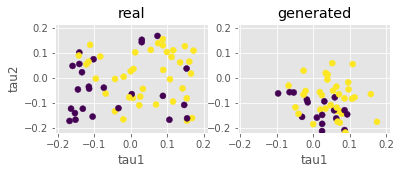

Step: 5400 of 50001.
Losses: G, D Gen, D Real: 0.6419, 0.5948, 0.6234
D Real - D Gen: 0.0286


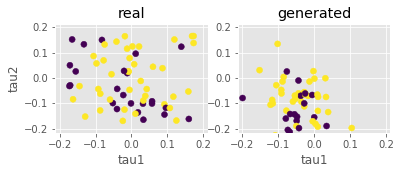

Step: 5500 of 50001.
Losses: G, D Gen, D Real: 0.8424, 0.5594, 0.6651
D Real - D Gen: 0.1058


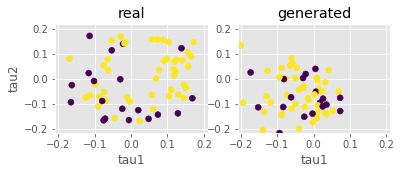

Step: 5600 of 50001.
Losses: G, D Gen, D Real: 0.6154, 0.6332, 0.6467
D Real - D Gen: 0.0135


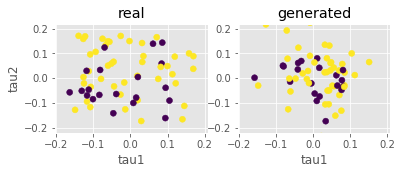

Step: 5700 of 50001.
Losses: G, D Gen, D Real: 0.6260, 0.6839, 0.5978
D Real - D Gen: -0.0861


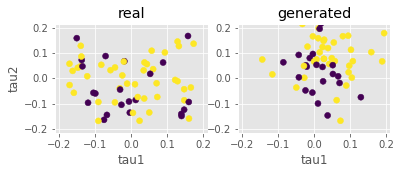

Step: 5800 of 50001.
Losses: G, D Gen, D Real: 0.6356, 0.7355, 0.6048
D Real - D Gen: -0.1307


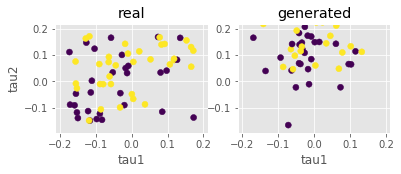

Step: 5900 of 50001.
Losses: G, D Gen, D Real: 0.5070, 0.7449, 0.6193
D Real - D Gen: -0.1256


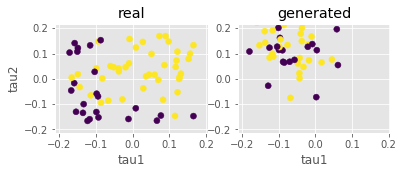

Step: 6000 of 50001.
Losses: G, D Gen, D Real: 0.6771, 0.7003, 0.5921
D Real - D Gen: -0.1082


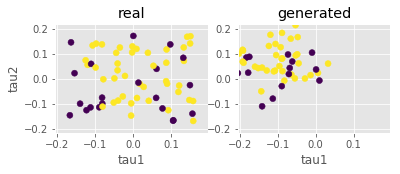

Step: 6100 of 50001.
Losses: G, D Gen, D Real: 0.8787, 0.6002, 0.6198
D Real - D Gen: 0.0196


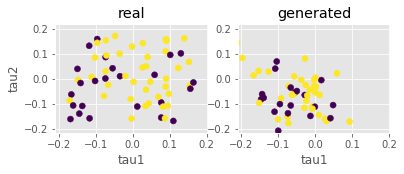

Step: 6200 of 50001.
Losses: G, D Gen, D Real: 0.5808, 0.6272, 0.6095
D Real - D Gen: -0.0177


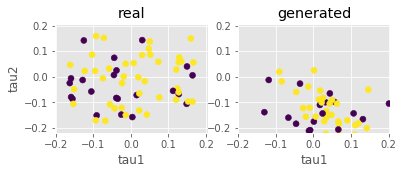

Step: 6300 of 50001.
Losses: G, D Gen, D Real: 0.6307, 0.6413, 0.5860
D Real - D Gen: -0.0553


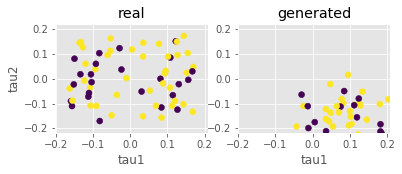

Step: 6400 of 50001.
Losses: G, D Gen, D Real: 0.5856, 0.6285, 0.6199
D Real - D Gen: -0.0087


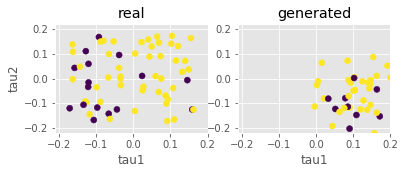

Step: 6500 of 50001.
Losses: G, D Gen, D Real: 0.6361, 0.6631, 0.6565
D Real - D Gen: -0.0066


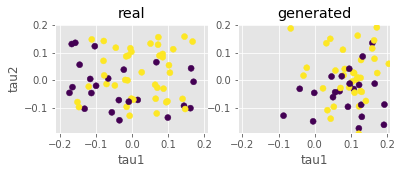

Step: 6600 of 50001.
Losses: G, D Gen, D Real: 0.6980, 0.7038, 0.6246
D Real - D Gen: -0.0791


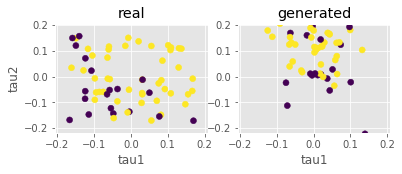

Step: 6700 of 50001.
Losses: G, D Gen, D Real: 0.5578, 0.6691, 0.6205
D Real - D Gen: -0.0486


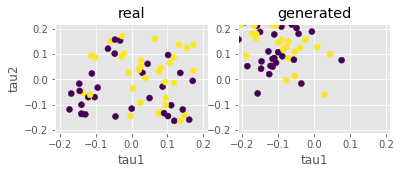

Step: 6800 of 50001.
Losses: G, D Gen, D Real: 0.6196, 0.6522, 0.6261
D Real - D Gen: -0.0261


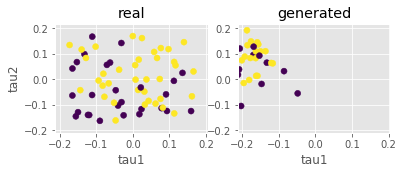

Step: 6900 of 50001.
Losses: G, D Gen, D Real: 0.6975, 0.6700, 0.6140
D Real - D Gen: -0.0560


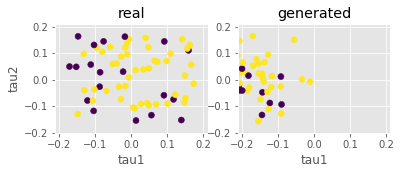

Step: 7000 of 50001.
Losses: G, D Gen, D Real: 0.5566, 0.6737, 0.6272
D Real - D Gen: -0.0465


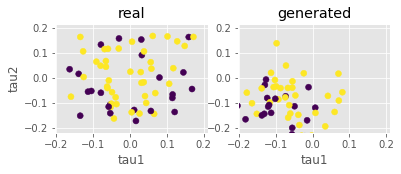

Step: 7100 of 50001.
Losses: G, D Gen, D Real: 0.6206, 0.6709, 0.6396
D Real - D Gen: -0.0313


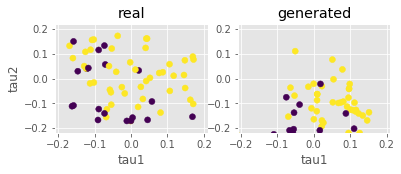

Step: 7200 of 50001.
Losses: G, D Gen, D Real: 0.6572, 0.7053, 0.6454
D Real - D Gen: -0.0599


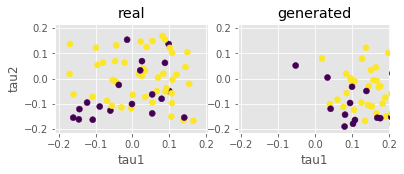

Step: 7300 of 50001.
Losses: G, D Gen, D Real: 0.5654, 0.7002, 0.6294
D Real - D Gen: -0.0707


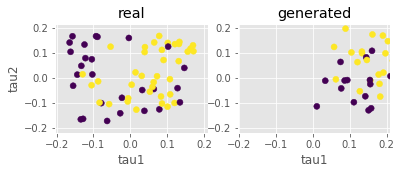

Step: 7400 of 50001.
Losses: G, D Gen, D Real: 0.6622, 0.6377, 0.6256
D Real - D Gen: -0.0121


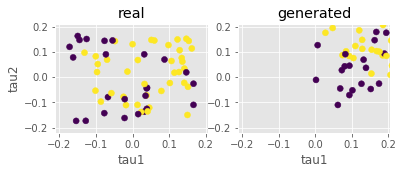

Step: 7500 of 50001.
Losses: G, D Gen, D Real: 0.8168, 0.6338, 0.6194
D Real - D Gen: -0.0144


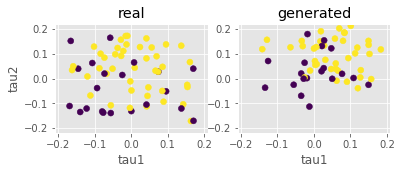

Step: 7600 of 50001.
Losses: G, D Gen, D Real: 0.5466, 0.6463, 0.6516
D Real - D Gen: 0.0053


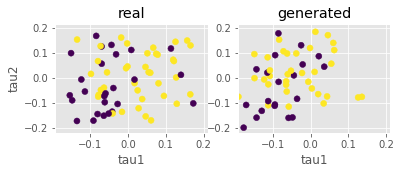

Step: 7700 of 50001.
Losses: G, D Gen, D Real: 0.5738, 0.7232, 0.6097
D Real - D Gen: -0.1135


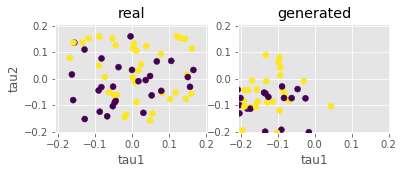

Step: 7800 of 50001.
Losses: G, D Gen, D Real: 0.5567, 0.6584, 0.6177
D Real - D Gen: -0.0407


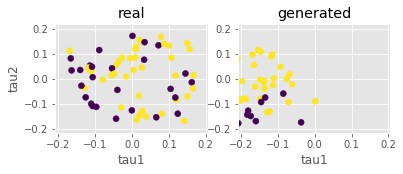

Step: 7900 of 50001.
Losses: G, D Gen, D Real: 0.6515, 0.6049, 0.6285
D Real - D Gen: 0.0236


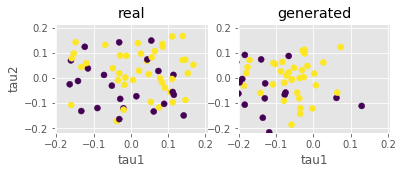

Step: 8000 of 50001.
Losses: G, D Gen, D Real: 0.5840, 0.7247, 0.6346
D Real - D Gen: -0.0901


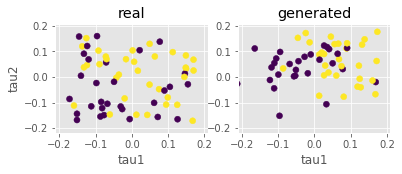

Step: 8100 of 50001.
Losses: G, D Gen, D Real: 0.5191, 0.7196, 0.6139
D Real - D Gen: -0.1057


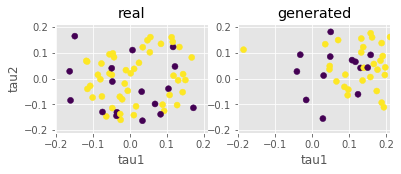

Step: 8200 of 50001.
Losses: G, D Gen, D Real: 0.6001, 0.6786, 0.6121
D Real - D Gen: -0.0665


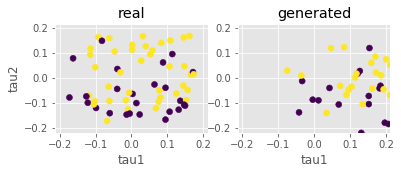

Step: 8300 of 50001.
Losses: G, D Gen, D Real: 0.7324, 0.6304, 0.6360
D Real - D Gen: 0.0056


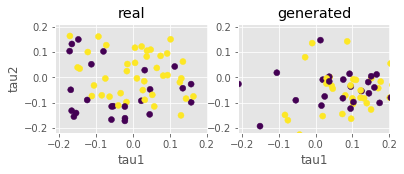

Step: 8400 of 50001.
Losses: G, D Gen, D Real: 0.5557, 0.6650, 0.6401
D Real - D Gen: -0.0249


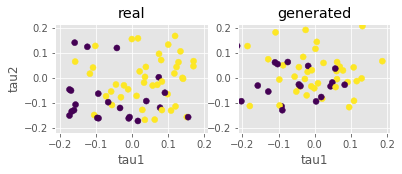

Step: 8500 of 50001.
Losses: G, D Gen, D Real: 0.5778, 0.6236, 0.6254
D Real - D Gen: 0.0019


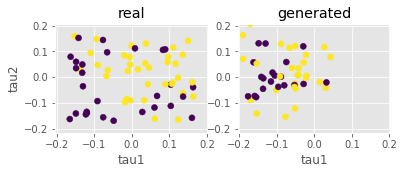

Step: 8600 of 50001.
Losses: G, D Gen, D Real: 0.7803, 0.6463, 0.6351
D Real - D Gen: -0.0112


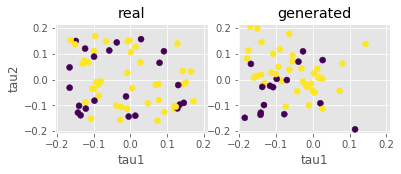

Step: 8700 of 50001.
Losses: G, D Gen, D Real: 0.5773, 0.6694, 0.6281
D Real - D Gen: -0.0412


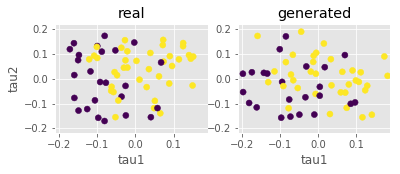

Step: 8800 of 50001.
Losses: G, D Gen, D Real: 0.6442, 0.7345, 0.6399
D Real - D Gen: -0.0946


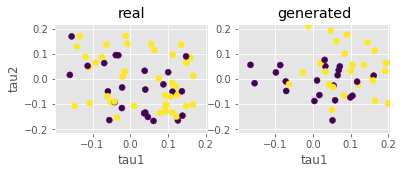

Step: 8900 of 50001.
Losses: G, D Gen, D Real: 0.5992, 0.6419, 0.6303
D Real - D Gen: -0.0117


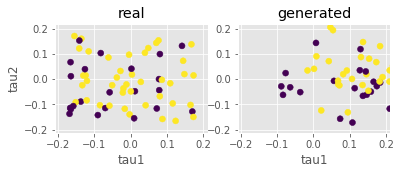

Step: 9000 of 50001.
Losses: G, D Gen, D Real: 0.6107, 0.7016, 0.6482
D Real - D Gen: -0.0534


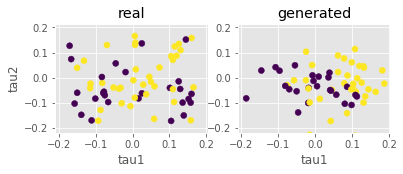

Step: 9100 of 50001.
Losses: G, D Gen, D Real: 0.6219, 0.6651, 0.6571
D Real - D Gen: -0.0080


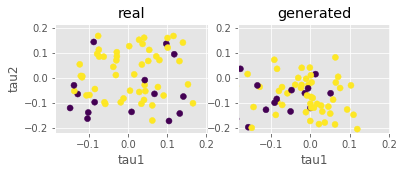

Step: 9200 of 50001.
Losses: G, D Gen, D Real: 0.6105, 0.5875, 0.6372
D Real - D Gen: 0.0497


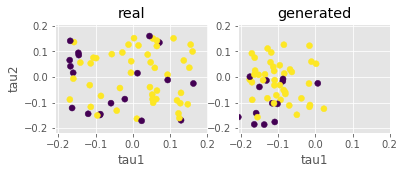

Step: 9300 of 50001.
Losses: G, D Gen, D Real: 0.5838, 0.6620, 0.6394
D Real - D Gen: -0.0226


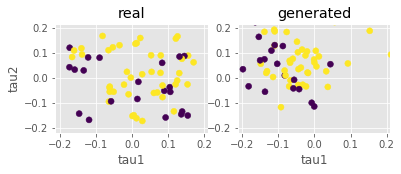

Step: 9400 of 50001.
Losses: G, D Gen, D Real: 0.6085, 0.7662, 0.6122
D Real - D Gen: -0.1540


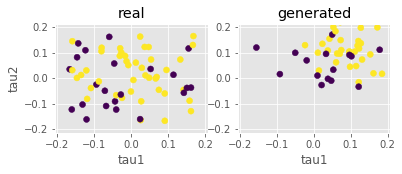

Step: 9500 of 50001.
Losses: G, D Gen, D Real: 0.6169, 0.6473, 0.6495
D Real - D Gen: 0.0022


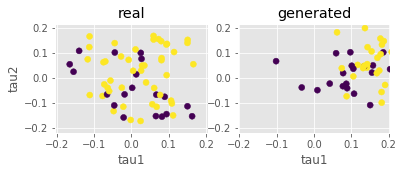

Step: 9600 of 50001.
Losses: G, D Gen, D Real: 0.6375, 0.6295, 0.6539
D Real - D Gen: 0.0244


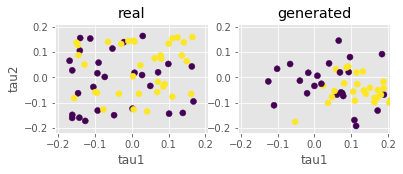

Step: 9700 of 50001.
Losses: G, D Gen, D Real: 0.6537, 0.7062, 0.6515
D Real - D Gen: -0.0547


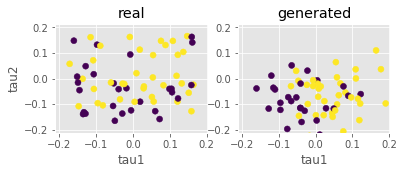

Step: 9800 of 50001.
Losses: G, D Gen, D Real: 0.5988, 0.6755, 0.6520
D Real - D Gen: -0.0235


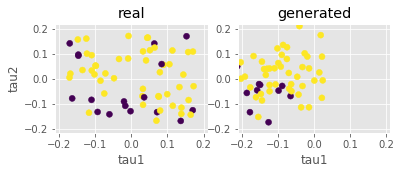

Step: 9900 of 50001.
Losses: G, D Gen, D Real: 0.6289, 0.6168, 0.6529
D Real - D Gen: 0.0361


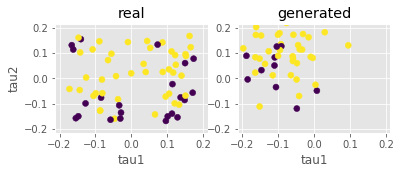

Step: 10000 of 50001.
Losses: G, D Gen, D Real: 0.9048, 0.6625, 0.6196
D Real - D Gen: -0.0429


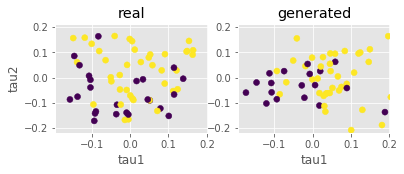

Step: 10100 of 50001.
Losses: G, D Gen, D Real: 0.6016, 0.6364, 0.6525
D Real - D Gen: 0.0161


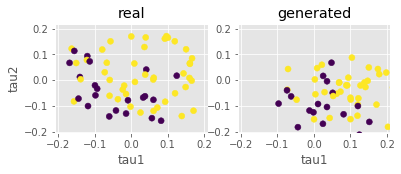

Step: 10200 of 50001.
Losses: G, D Gen, D Real: 0.6422, 0.6349, 0.6631
D Real - D Gen: 0.0282


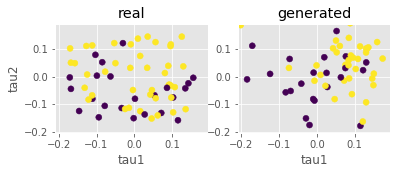

Step: 10300 of 50001.
Losses: G, D Gen, D Real: 0.5502, 0.6716, 0.6194
D Real - D Gen: -0.0522


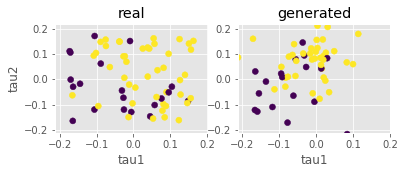

Step: 10400 of 50001.
Losses: G, D Gen, D Real: 0.6123, 0.6810, 0.6291
D Real - D Gen: -0.0519


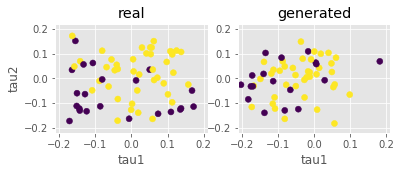

Step: 10500 of 50001.
Losses: G, D Gen, D Real: 0.7272, 0.7110, 0.6460
D Real - D Gen: -0.0650


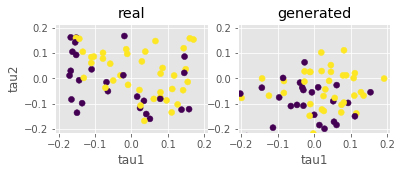

Step: 10600 of 50001.
Losses: G, D Gen, D Real: 0.5821, 0.6676, 0.6750
D Real - D Gen: 0.0073


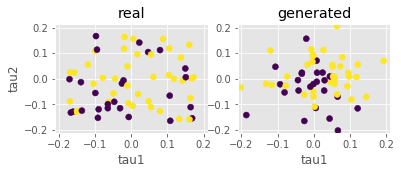

Step: 10700 of 50001.
Losses: G, D Gen, D Real: 0.5976, 0.6564, 0.6173
D Real - D Gen: -0.0391


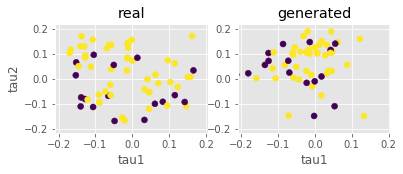

Step: 10800 of 50001.
Losses: G, D Gen, D Real: 0.7325, 0.6411, 0.5960
D Real - D Gen: -0.0452


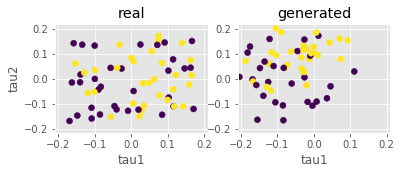

Step: 10900 of 50001.
Losses: G, D Gen, D Real: 0.5541, 0.6792, 0.6588
D Real - D Gen: -0.0205


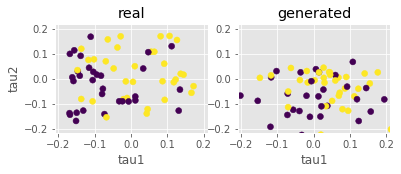

Step: 11000 of 50001.
Losses: G, D Gen, D Real: 0.5931, 0.7189, 0.6500
D Real - D Gen: -0.0689


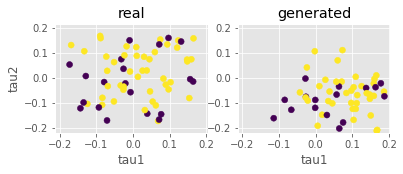

Step: 11100 of 50001.
Losses: G, D Gen, D Real: 0.7260, 0.6676, 0.6832
D Real - D Gen: 0.0156


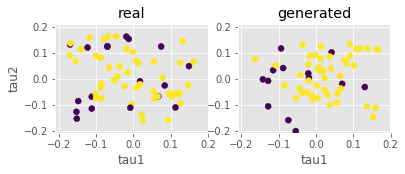

Step: 11200 of 50001.
Losses: G, D Gen, D Real: 0.5561, 0.6895, 0.6434
D Real - D Gen: -0.0460


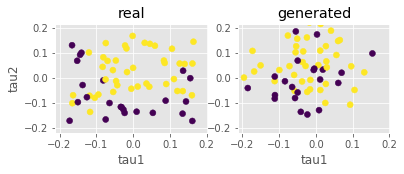

Step: 11300 of 50001.
Losses: G, D Gen, D Real: 0.6406, 0.6498, 0.6424
D Real - D Gen: -0.0074


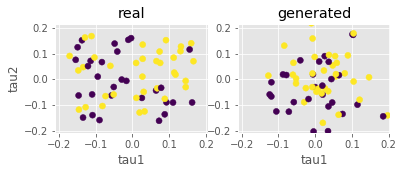

Step: 11400 of 50001.
Losses: G, D Gen, D Real: 0.5620, 0.6626, 0.6525
D Real - D Gen: -0.0101


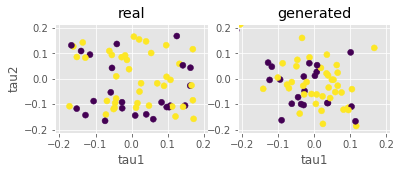

Step: 11500 of 50001.
Losses: G, D Gen, D Real: 0.5849, 0.6613, 0.6310
D Real - D Gen: -0.0304


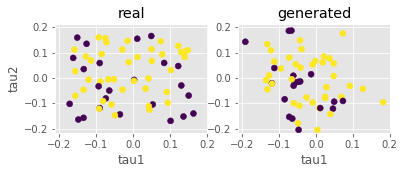

Step: 11600 of 50001.
Losses: G, D Gen, D Real: 0.7292, 0.6542, 0.6553
D Real - D Gen: 0.0011


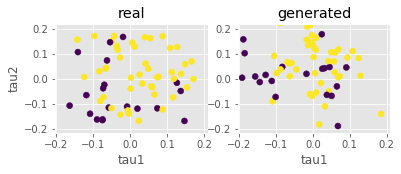

Step: 11700 of 50001.
Losses: G, D Gen, D Real: 0.5729, 0.6936, 0.6590
D Real - D Gen: -0.0345


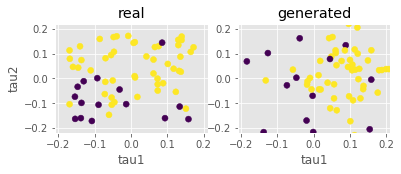

Step: 11800 of 50001.
Losses: G, D Gen, D Real: 0.5867, 0.7400, 0.6364
D Real - D Gen: -0.1035


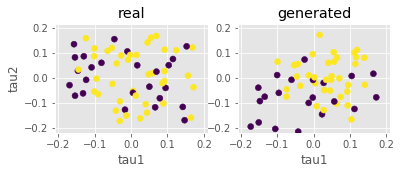

Step: 11900 of 50001.
Losses: G, D Gen, D Real: 0.7112, 0.6714, 0.6818
D Real - D Gen: 0.0104


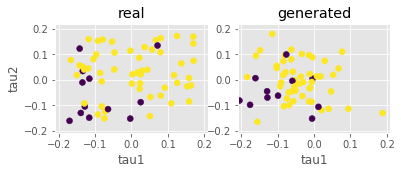

Step: 12000 of 50001.
Losses: G, D Gen, D Real: 0.6358, 0.6365, 0.6709
D Real - D Gen: 0.0345


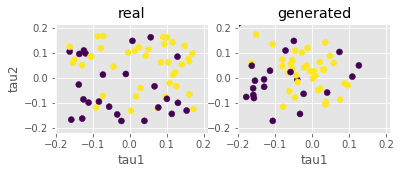

Step: 12100 of 50001.
Losses: G, D Gen, D Real: 0.6108, 0.7090, 0.6627
D Real - D Gen: -0.0463


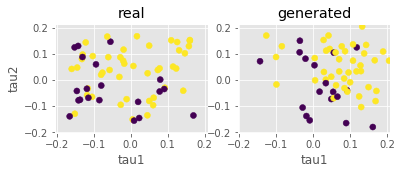

Step: 12200 of 50001.
Losses: G, D Gen, D Real: 0.6696, 0.7293, 0.6563
D Real - D Gen: -0.0730


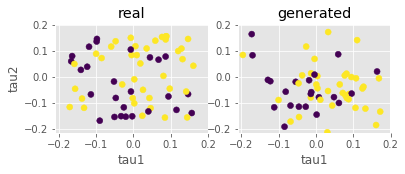

Step: 12300 of 50001.
Losses: G, D Gen, D Real: 0.5790, 0.7023, 0.6578
D Real - D Gen: -0.0444


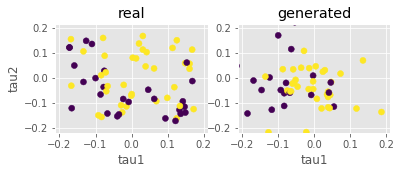

Step: 12400 of 50001.
Losses: G, D Gen, D Real: 0.6488, 0.6653, 0.6616
D Real - D Gen: -0.0037


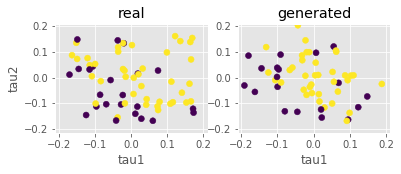

Step: 12500 of 50001.
Losses: G, D Gen, D Real: 0.7401, 0.6850, 0.6537
D Real - D Gen: -0.0313


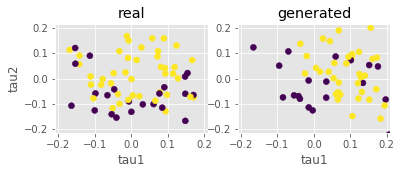

Step: 12600 of 50001.
Losses: G, D Gen, D Real: 0.5966, 0.6922, 0.6656
D Real - D Gen: -0.0266


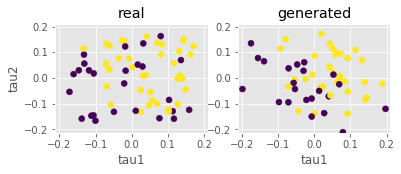

Step: 12700 of 50001.
Losses: G, D Gen, D Real: 0.6384, 0.6425, 0.6559
D Real - D Gen: 0.0134


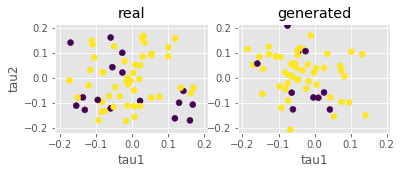

Step: 12800 of 50001.
Losses: G, D Gen, D Real: 0.5806, 0.6261, 0.6477
D Real - D Gen: 0.0215


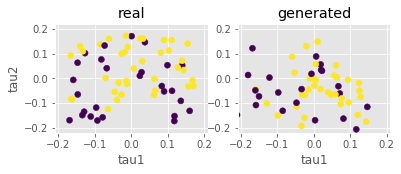

Step: 12900 of 50001.
Losses: G, D Gen, D Real: 0.6246, 0.6992, 0.6630
D Real - D Gen: -0.0362


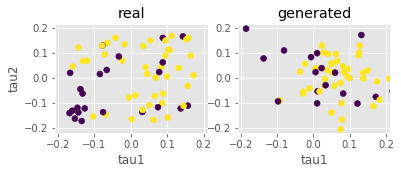

Step: 13000 of 50001.
Losses: G, D Gen, D Real: 0.6734, 0.6931, 0.6581
D Real - D Gen: -0.0351


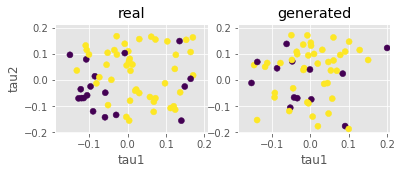

Step: 13100 of 50001.
Losses: G, D Gen, D Real: 0.6173, 0.6807, 0.6741
D Real - D Gen: -0.0066


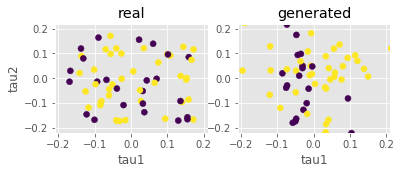

Step: 13200 of 50001.
Losses: G, D Gen, D Real: 0.6342, 0.6562, 0.6746
D Real - D Gen: 0.0183


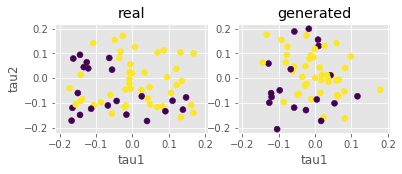

Step: 13300 of 50001.
Losses: G, D Gen, D Real: 0.6742, 0.6696, 0.6710
D Real - D Gen: 0.0014


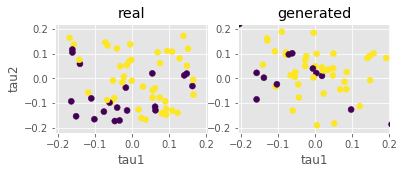

Step: 13400 of 50001.
Losses: G, D Gen, D Real: 0.5999, 0.5962, 0.6795
D Real - D Gen: 0.0834


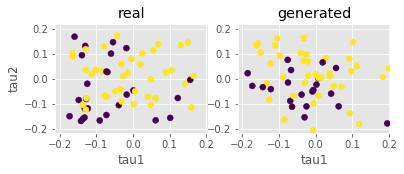

Step: 13500 of 50001.
Losses: G, D Gen, D Real: 0.6108, 0.6361, 0.6632
D Real - D Gen: 0.0271


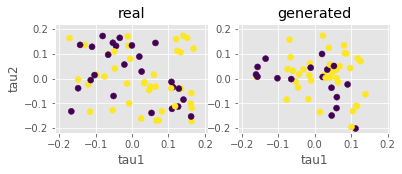

Step: 13600 of 50001.
Losses: G, D Gen, D Real: 0.7042, 0.6901, 0.6510
D Real - D Gen: -0.0391


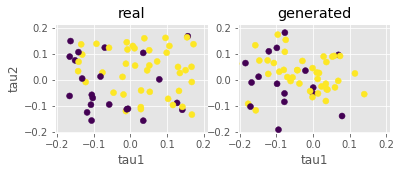

Step: 13700 of 50001.
Losses: G, D Gen, D Real: 0.5709, 0.7195, 0.6494
D Real - D Gen: -0.0701


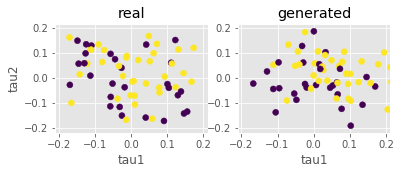

Step: 13800 of 50001.
Losses: G, D Gen, D Real: 0.6506, 0.7026, 0.6399
D Real - D Gen: -0.0626


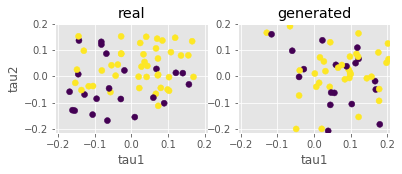

Step: 13900 of 50001.
Losses: G, D Gen, D Real: 0.5894, 0.7303, 0.6467
D Real - D Gen: -0.0836


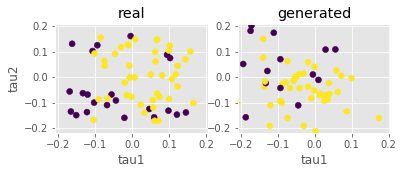

Step: 14000 of 50001.
Losses: G, D Gen, D Real: 0.6349, 0.6462, 0.6546
D Real - D Gen: 0.0084


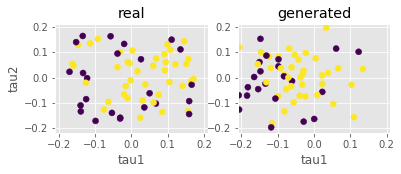

Step: 14100 of 50001.
Losses: G, D Gen, D Real: 0.6291, 0.6976, 0.6608
D Real - D Gen: -0.0368


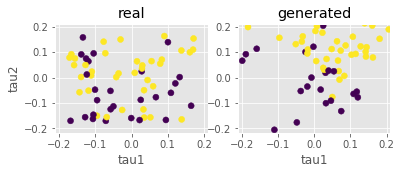

Step: 14200 of 50001.
Losses: G, D Gen, D Real: 0.5830, 0.6681, 0.6313
D Real - D Gen: -0.0367


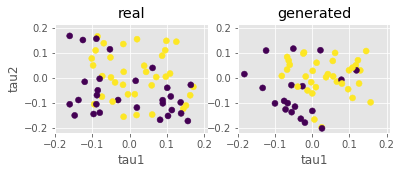

Step: 14300 of 50001.
Losses: G, D Gen, D Real: 0.6365, 0.6857, 0.6573
D Real - D Gen: -0.0285


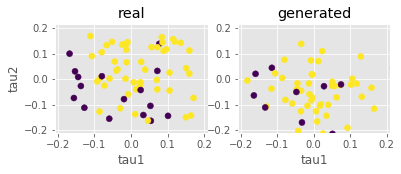

Step: 14400 of 50001.
Losses: G, D Gen, D Real: 0.6765, 0.6943, 0.6854
D Real - D Gen: -0.0088


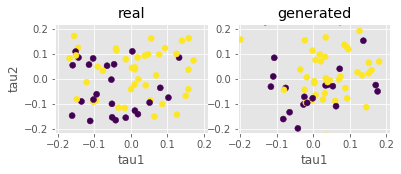

Step: 14500 of 50001.
Losses: G, D Gen, D Real: 0.6163, 0.7181, 0.6692
D Real - D Gen: -0.0488


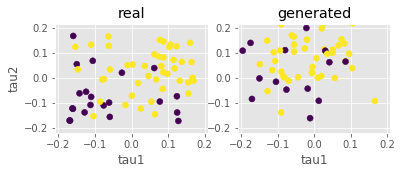

Step: 14600 of 50001.
Losses: G, D Gen, D Real: 0.6364, 0.6823, 0.6316
D Real - D Gen: -0.0506


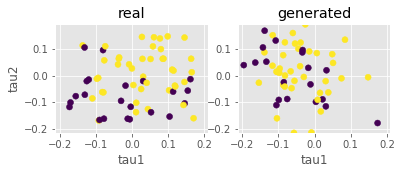

Step: 14700 of 50001.
Losses: G, D Gen, D Real: 0.6374, 0.7712, 0.6595
D Real - D Gen: -0.1117


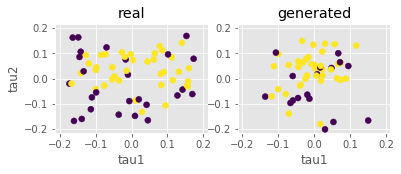

Step: 14800 of 50001.
Losses: G, D Gen, D Real: 0.6380, 0.7027, 0.6733
D Real - D Gen: -0.0293


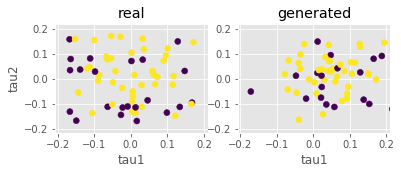

Step: 14900 of 50001.
Losses: G, D Gen, D Real: 0.6717, 0.6362, 0.6855
D Real - D Gen: 0.0493


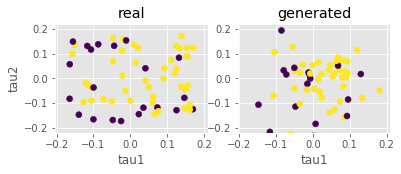

Step: 15000 of 50001.
Losses: G, D Gen, D Real: 0.7033, 0.6757, 0.6972
D Real - D Gen: 0.0216


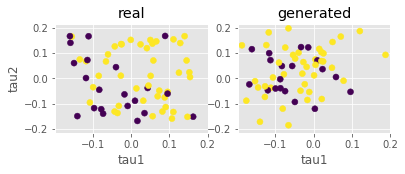

Step: 15100 of 50001.
Losses: G, D Gen, D Real: 0.6269, 0.6898, 0.6646
D Real - D Gen: -0.0252


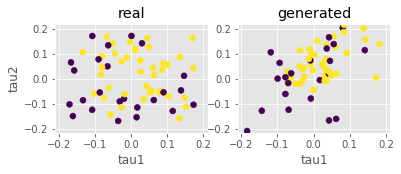

Step: 15200 of 50001.
Losses: G, D Gen, D Real: 0.6504, 0.7024, 0.6646
D Real - D Gen: -0.0379


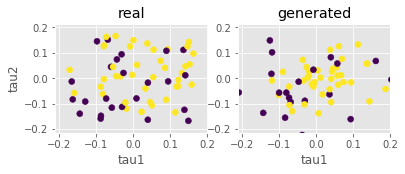

Step: 15300 of 50001.
Losses: G, D Gen, D Real: 0.6113, 0.6873, 0.6742
D Real - D Gen: -0.0131


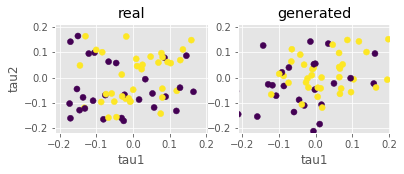

Step: 15400 of 50001.
Losses: G, D Gen, D Real: 0.6624, 0.6384, 0.6606
D Real - D Gen: 0.0222


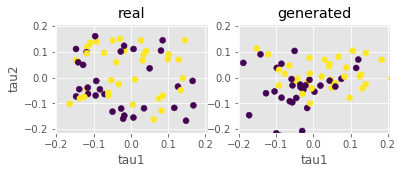

Step: 15500 of 50001.
Losses: G, D Gen, D Real: 0.6244, 0.7268, 0.6708
D Real - D Gen: -0.0561


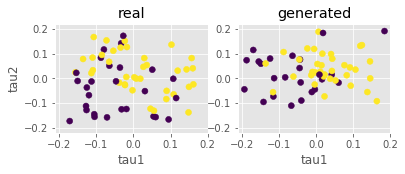

Step: 15600 of 50001.
Losses: G, D Gen, D Real: 0.6081, 0.6694, 0.6387
D Real - D Gen: -0.0307


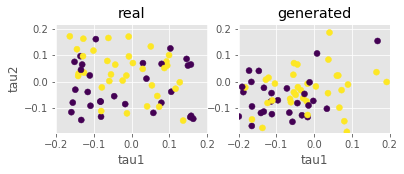

Step: 15700 of 50001.
Losses: G, D Gen, D Real: 0.6181, 0.6936, 0.6388
D Real - D Gen: -0.0548


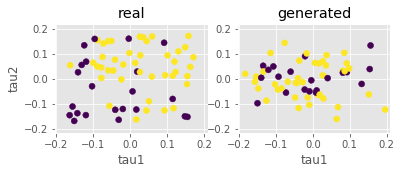

Step: 15800 of 50001.
Losses: G, D Gen, D Real: 0.6287, 0.7119, 0.6399
D Real - D Gen: -0.0720


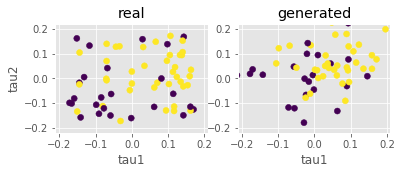

Step: 15900 of 50001.
Losses: G, D Gen, D Real: 0.6464, 0.6501, 0.6793
D Real - D Gen: 0.0292


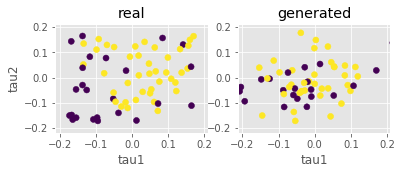

Step: 16000 of 50001.
Losses: G, D Gen, D Real: 0.6328, 0.7000, 0.6621
D Real - D Gen: -0.0379


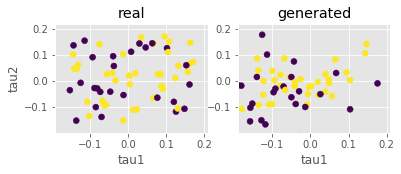

Step: 16100 of 50001.
Losses: G, D Gen, D Real: 0.7730, 0.7153, 0.6716
D Real - D Gen: -0.0437


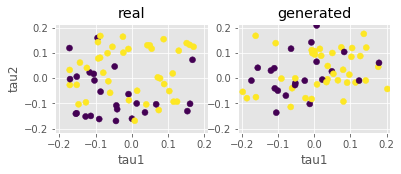

Step: 16200 of 50001.
Losses: G, D Gen, D Real: 0.6284, 0.7227, 0.6762
D Real - D Gen: -0.0465


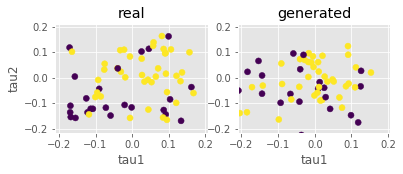

Step: 16300 of 50001.
Losses: G, D Gen, D Real: 0.6963, 0.6648, 0.7075
D Real - D Gen: 0.0427


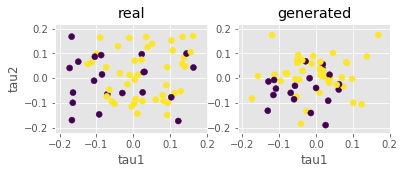

Step: 16400 of 50001.
Losses: G, D Gen, D Real: 0.6417, 0.6837, 0.6720
D Real - D Gen: -0.0117


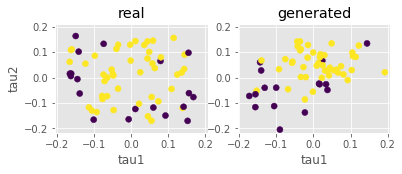

Step: 16500 of 50001.
Losses: G, D Gen, D Real: 0.6157, 0.6771, 0.6520
D Real - D Gen: -0.0251


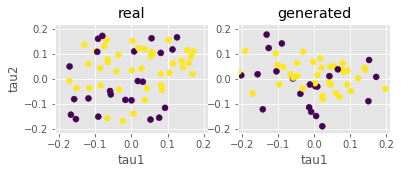

Step: 16600 of 50001.
Losses: G, D Gen, D Real: 0.6691, 0.6934, 0.6807
D Real - D Gen: -0.0127


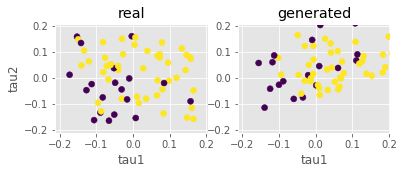

Step: 16700 of 50001.
Losses: G, D Gen, D Real: 0.6452, 0.6850, 0.6717
D Real - D Gen: -0.0133


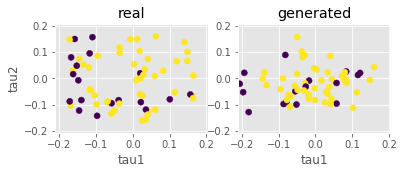

Step: 16800 of 50001.
Losses: G, D Gen, D Real: 0.6392, 0.7013, 0.6871
D Real - D Gen: -0.0142


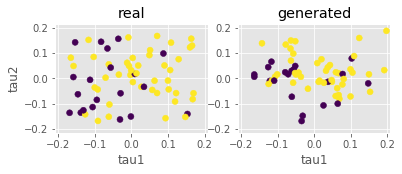

Step: 16900 of 50001.
Losses: G, D Gen, D Real: 0.7245, 0.7111, 0.6957
D Real - D Gen: -0.0154


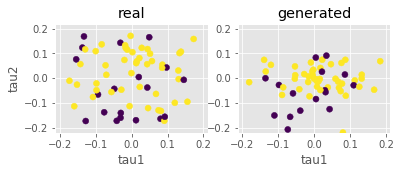

Step: 17000 of 50001.
Losses: G, D Gen, D Real: 0.6448, 0.6927, 0.6718
D Real - D Gen: -0.0209


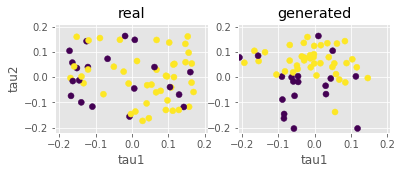

Step: 17100 of 50001.
Losses: G, D Gen, D Real: 0.6407, 0.6785, 0.6657
D Real - D Gen: -0.0128


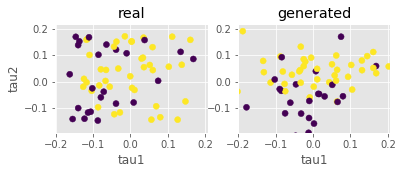

Step: 17200 of 50001.
Losses: G, D Gen, D Real: 0.6994, 0.6922, 0.6582
D Real - D Gen: -0.0340


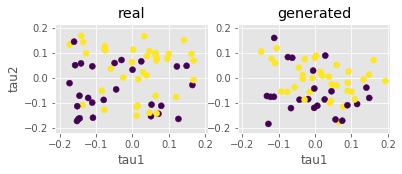

Step: 17300 of 50001.
Losses: G, D Gen, D Real: 0.6328, 0.6908, 0.6621
D Real - D Gen: -0.0288


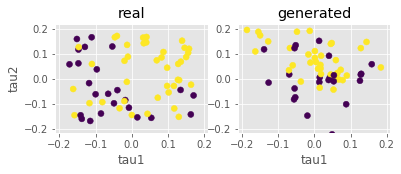

Step: 17400 of 50001.
Losses: G, D Gen, D Real: 0.6646, 0.6994, 0.6701
D Real - D Gen: -0.0293


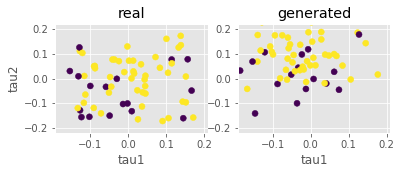

Step: 17500 of 50001.
Losses: G, D Gen, D Real: 0.7162, 0.6936, 0.6713
D Real - D Gen: -0.0223


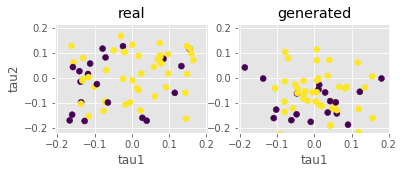

Step: 17600 of 50001.
Losses: G, D Gen, D Real: 0.6578, 0.7020, 0.6910
D Real - D Gen: -0.0110


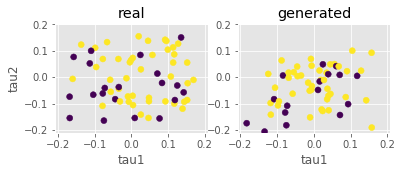

Step: 17700 of 50001.
Losses: G, D Gen, D Real: 0.6710, 0.6778, 0.6716
D Real - D Gen: -0.0062


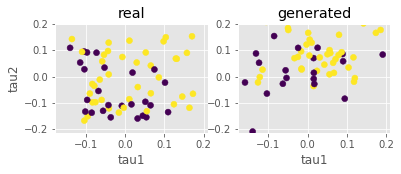

Step: 17800 of 50001.
Losses: G, D Gen, D Real: 0.6505, 0.6747, 0.6872
D Real - D Gen: 0.0124


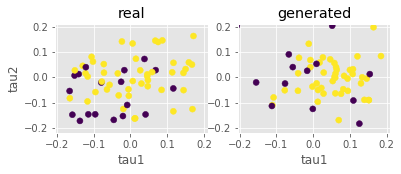

Step: 17900 of 50001.
Losses: G, D Gen, D Real: 0.6641, 0.6864, 0.6800
D Real - D Gen: -0.0063


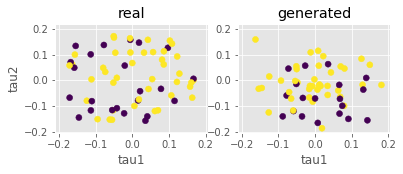

Step: 18000 of 50001.
Losses: G, D Gen, D Real: 0.6860, 0.6774, 0.6916
D Real - D Gen: 0.0141


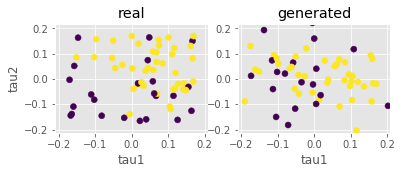

Step: 18100 of 50001.
Losses: G, D Gen, D Real: 0.6377, 0.6914, 0.6791
D Real - D Gen: -0.0123


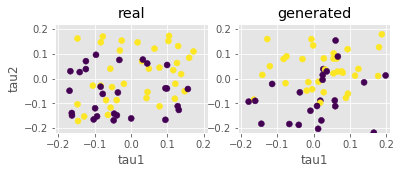

Step: 18200 of 50001.
Losses: G, D Gen, D Real: 0.6758, 0.6698, 0.6774
D Real - D Gen: 0.0076


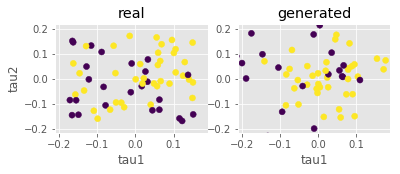

Step: 18300 of 50001.
Losses: G, D Gen, D Real: 0.6684, 0.6944, 0.6851
D Real - D Gen: -0.0093


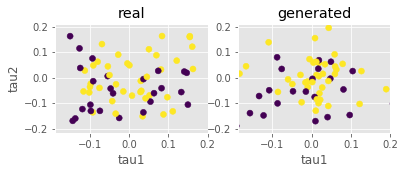

Step: 18400 of 50001.
Losses: G, D Gen, D Real: 0.6578, 0.6847, 0.6769
D Real - D Gen: -0.0079


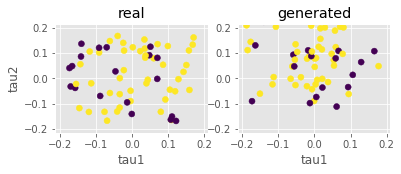

Step: 18500 of 50001.
Losses: G, D Gen, D Real: 0.6456, 0.6981, 0.6755
D Real - D Gen: -0.0226


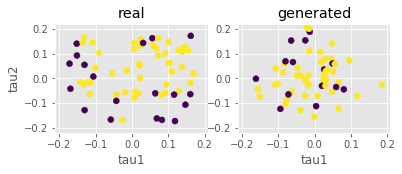

Step: 18600 of 50001.
Losses: G, D Gen, D Real: 0.6893, 0.7080, 0.6720
D Real - D Gen: -0.0360


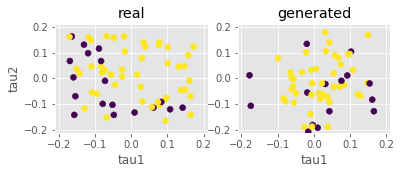

Step: 18700 of 50001.
Losses: G, D Gen, D Real: 0.6488, 0.6969, 0.6732
D Real - D Gen: -0.0237


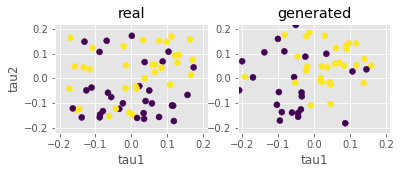

Step: 18800 of 50001.
Losses: G, D Gen, D Real: 0.6588, 0.6948, 0.6757
D Real - D Gen: -0.0192


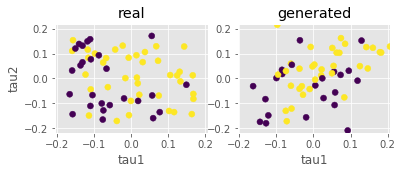

Step: 18900 of 50001.
Losses: G, D Gen, D Real: 0.6540, 0.6849, 0.6714
D Real - D Gen: -0.0135


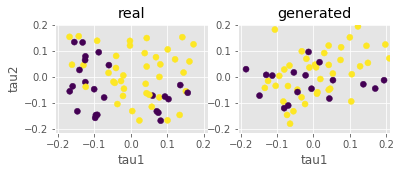

Step: 19000 of 50001.
Losses: G, D Gen, D Real: 0.6518, 0.6837, 0.6831
D Real - D Gen: -0.0005


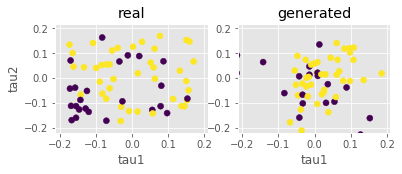

Step: 19100 of 50001.
Losses: G, D Gen, D Real: 0.6803, 0.6857, 0.6836
D Real - D Gen: -0.0021


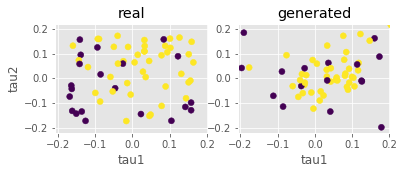

Step: 19200 of 50001.
Losses: G, D Gen, D Real: 0.6374, 0.7015, 0.6780
D Real - D Gen: -0.0236


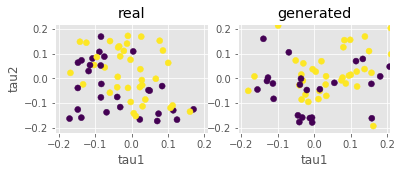

Step: 19300 of 50001.
Losses: G, D Gen, D Real: 0.6367, 0.6507, 0.6691
D Real - D Gen: 0.0184


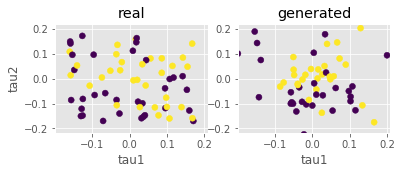

Step: 19400 of 50001.
Losses: G, D Gen, D Real: 0.6626, 0.7077, 0.6697
D Real - D Gen: -0.0379


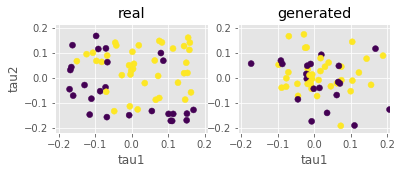

Step: 19500 of 50001.
Losses: G, D Gen, D Real: 0.6565, 0.6977, 0.6834
D Real - D Gen: -0.0142


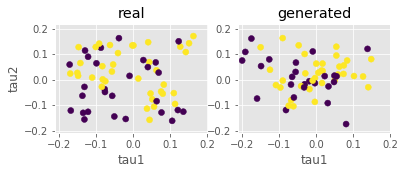

Step: 19600 of 50001.
Losses: G, D Gen, D Real: 0.6757, 0.6984, 0.6844
D Real - D Gen: -0.0140


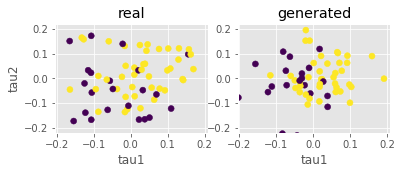

Step: 19700 of 50001.
Losses: G, D Gen, D Real: 0.6921, 0.6940, 0.6717
D Real - D Gen: -0.0223


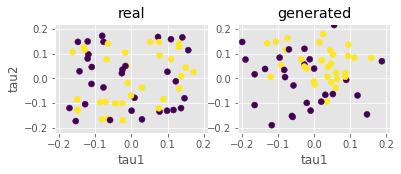

Step: 19800 of 50001.
Losses: G, D Gen, D Real: 0.6573, 0.6618, 0.6898
D Real - D Gen: 0.0280


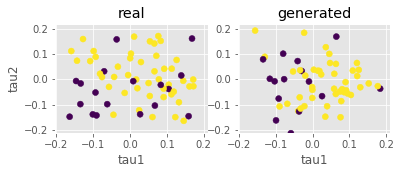

Step: 19900 of 50001.
Losses: G, D Gen, D Real: 0.6649, 0.7009, 0.6833
D Real - D Gen: -0.0176


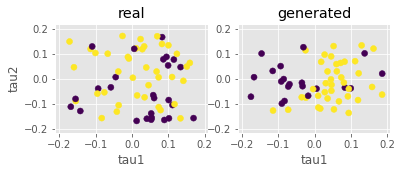

Step: 20000 of 50001.
Losses: G, D Gen, D Real: 0.6940, 0.6963, 0.6715
D Real - D Gen: -0.0247


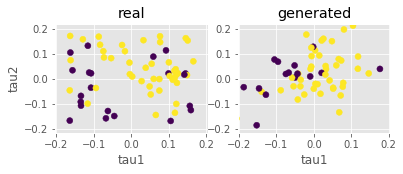

Step: 20100 of 50001.
Losses: G, D Gen, D Real: 0.6521, 0.6808, 0.6768
D Real - D Gen: -0.0041


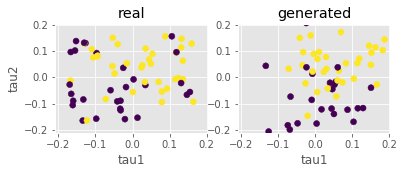

Step: 20200 of 50001.
Losses: G, D Gen, D Real: 0.6787, 0.6813, 0.6760
D Real - D Gen: -0.0054


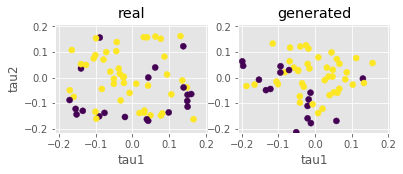

Step: 20300 of 50001.
Losses: G, D Gen, D Real: 0.6524, 0.6968, 0.6807
D Real - D Gen: -0.0161


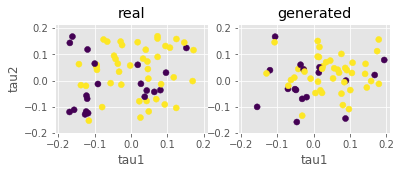

Step: 20400 of 50001.
Losses: G, D Gen, D Real: 0.6614, 0.6779, 0.6735
D Real - D Gen: -0.0045


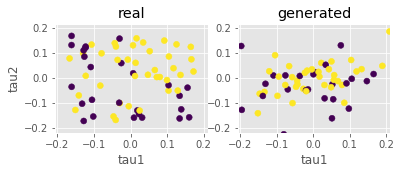

Step: 20500 of 50001.
Losses: G, D Gen, D Real: 0.6725, 0.7102, 0.6737
D Real - D Gen: -0.0365


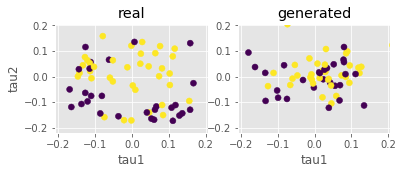

Step: 20600 of 50001.
Losses: G, D Gen, D Real: 0.6606, 0.6891, 0.6889
D Real - D Gen: -0.0002


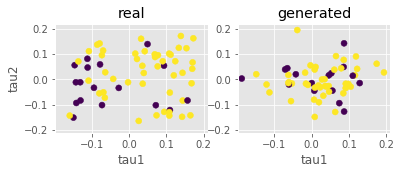

Step: 20700 of 50001.
Losses: G, D Gen, D Real: 0.6636, 0.6733, 0.6773
D Real - D Gen: 0.0040


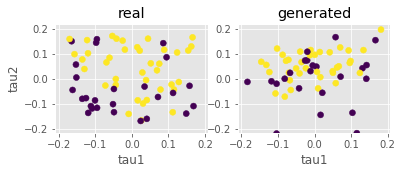

Step: 20800 of 50001.
Losses: G, D Gen, D Real: 0.6677, 0.7087, 0.6769
D Real - D Gen: -0.0318


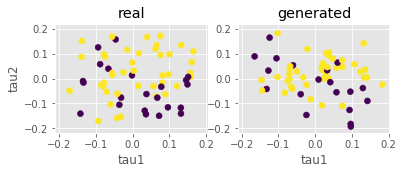

Step: 20900 of 50001.
Losses: G, D Gen, D Real: 0.6562, 0.6888, 0.7011
D Real - D Gen: 0.0123


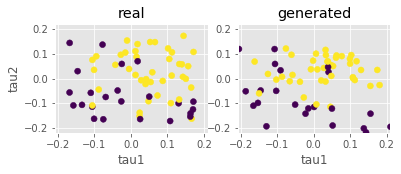

Step: 21000 of 50001.
Losses: G, D Gen, D Real: 0.6678, 0.6938, 0.6836
D Real - D Gen: -0.0102


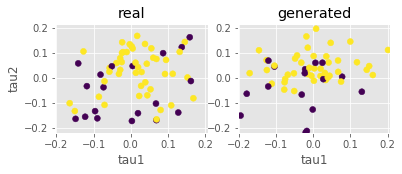

Step: 21100 of 50001.
Losses: G, D Gen, D Real: 0.6755, 0.7063, 0.6797
D Real - D Gen: -0.0266


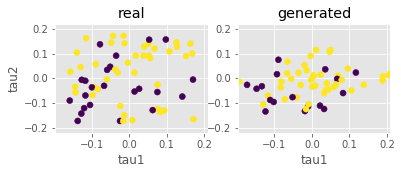

Step: 21200 of 50001.
Losses: G, D Gen, D Real: 0.6633, 0.6722, 0.6752
D Real - D Gen: 0.0030


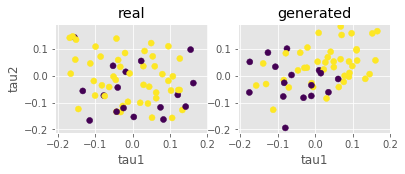

Step: 21300 of 50001.
Losses: G, D Gen, D Real: 0.6678, 0.6942, 0.6667
D Real - D Gen: -0.0275


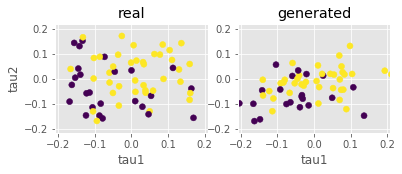

Step: 21400 of 50001.
Losses: G, D Gen, D Real: 0.6590, 0.6702, 0.6799
D Real - D Gen: 0.0097


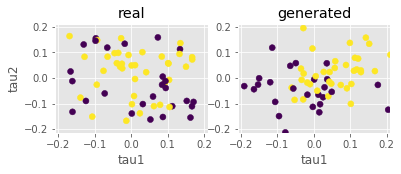

Step: 21500 of 50001.
Losses: G, D Gen, D Real: 0.6549, 0.6897, 0.6826
D Real - D Gen: -0.0071


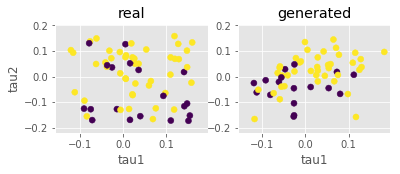

Step: 21600 of 50001.
Losses: G, D Gen, D Real: 0.6755, 0.6991, 0.6716
D Real - D Gen: -0.0276


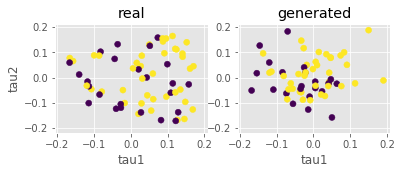

Step: 21700 of 50001.
Losses: G, D Gen, D Real: 0.6527, 0.6886, 0.6748
D Real - D Gen: -0.0138


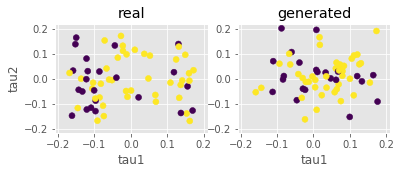

Step: 21800 of 50001.
Losses: G, D Gen, D Real: 0.6684, 0.6978, 0.6785
D Real - D Gen: -0.0194


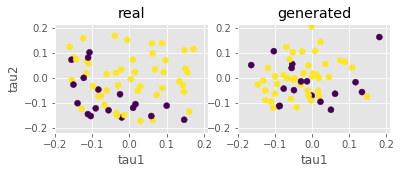

Step: 21900 of 50001.
Losses: G, D Gen, D Real: 0.6860, 0.6781, 0.6832
D Real - D Gen: 0.0051


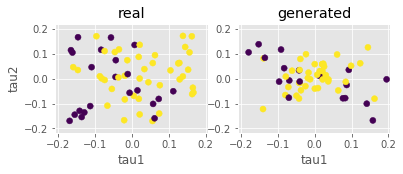

Step: 22000 of 50001.
Losses: G, D Gen, D Real: 0.6554, 0.6854, 0.6723
D Real - D Gen: -0.0130


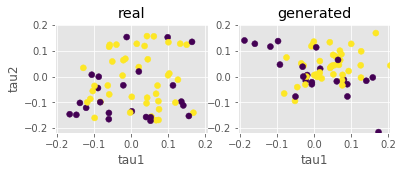

Step: 22100 of 50001.
Losses: G, D Gen, D Real: 0.6640, 0.7023, 0.6784
D Real - D Gen: -0.0239


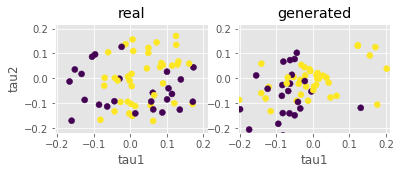

Step: 22200 of 50001.
Losses: G, D Gen, D Real: 0.6881, 0.6974, 0.6730
D Real - D Gen: -0.0243


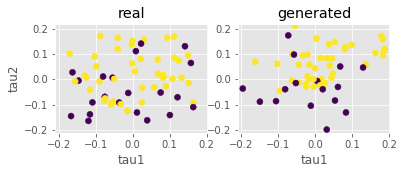

Step: 22300 of 50001.
Losses: G, D Gen, D Real: 0.6594, 0.6835, 0.6810
D Real - D Gen: -0.0025


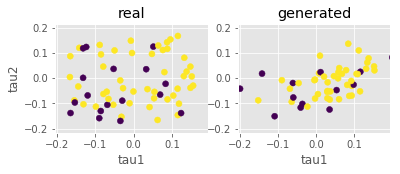

Step: 22400 of 50001.
Losses: G, D Gen, D Real: 0.6815, 0.6703, 0.6861
D Real - D Gen: 0.0157


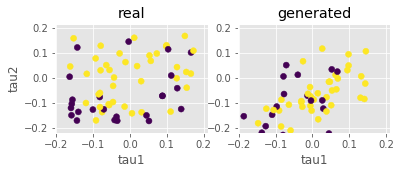

Step: 22500 of 50001.
Losses: G, D Gen, D Real: 0.7185, 0.6810, 0.6715
D Real - D Gen: -0.0096


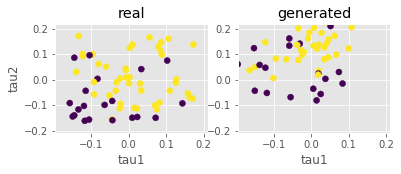

Step: 22600 of 50001.
Losses: G, D Gen, D Real: 0.6603, 0.7016, 0.6808
D Real - D Gen: -0.0209


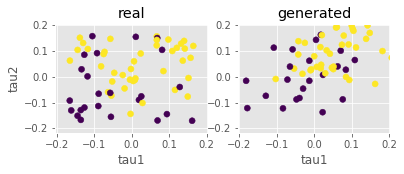

Step: 22700 of 50001.
Losses: G, D Gen, D Real: 0.6748, 0.6926, 0.6832
D Real - D Gen: -0.0095


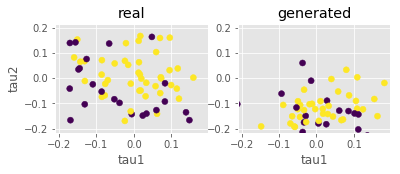

Step: 22800 of 50001.
Losses: G, D Gen, D Real: 0.6707, 0.7033, 0.6855
D Real - D Gen: -0.0178


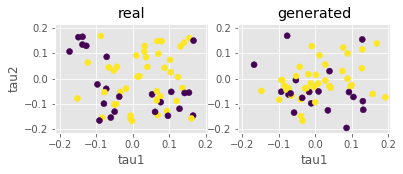

Step: 22900 of 50001.
Losses: G, D Gen, D Real: 0.6611, 0.6839, 0.6809
D Real - D Gen: -0.0030


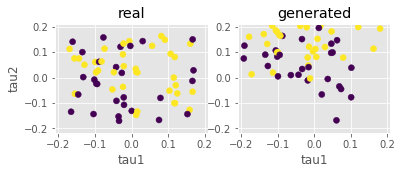

Step: 23000 of 50001.
Losses: G, D Gen, D Real: 0.6719, 0.6745, 0.6821
D Real - D Gen: 0.0076


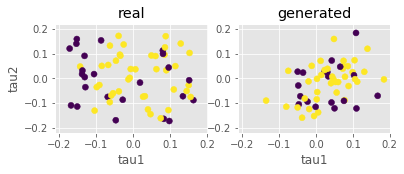

Step: 23100 of 50001.
Losses: G, D Gen, D Real: 0.6521, 0.7002, 0.6809
D Real - D Gen: -0.0193


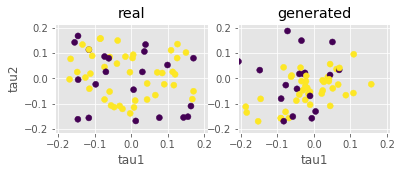

Step: 23200 of 50001.
Losses: G, D Gen, D Real: 0.6653, 0.6651, 0.6915
D Real - D Gen: 0.0263


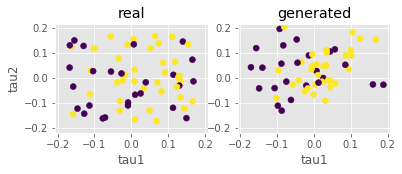

Step: 23300 of 50001.
Losses: G, D Gen, D Real: 0.6977, 0.6886, 0.6887
D Real - D Gen: 0.0001


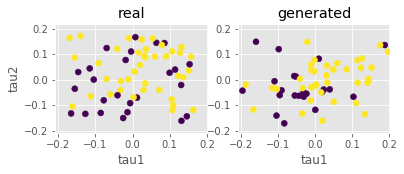

Step: 23400 of 50001.
Losses: G, D Gen, D Real: 0.6514, 0.7026, 0.6812
D Real - D Gen: -0.0213


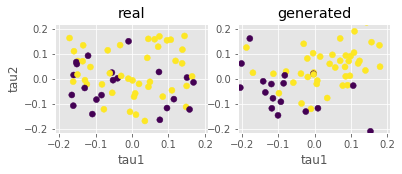

Step: 23500 of 50001.
Losses: G, D Gen, D Real: 0.6765, 0.6775, 0.6785
D Real - D Gen: 0.0010


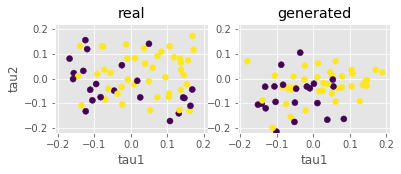

Step: 23600 of 50001.
Losses: G, D Gen, D Real: 0.7142, 0.6909, 0.6829
D Real - D Gen: -0.0080


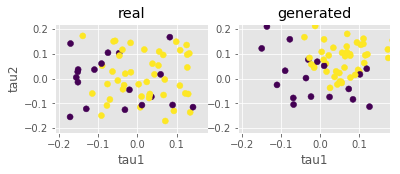

Step: 23700 of 50001.
Losses: G, D Gen, D Real: 0.6560, 0.7000, 0.6701
D Real - D Gen: -0.0298


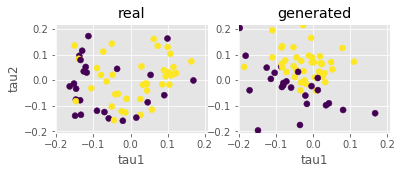

Step: 23800 of 50001.
Losses: G, D Gen, D Real: 0.6719, 0.6979, 0.6820
D Real - D Gen: -0.0159


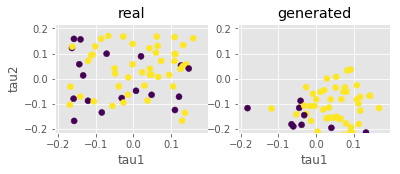

Step: 23900 of 50001.
Losses: G, D Gen, D Real: 0.6530, 0.6659, 0.6800
D Real - D Gen: 0.0141


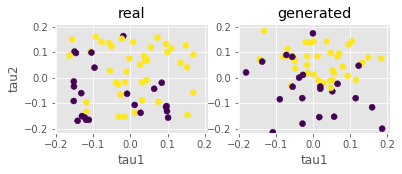

Step: 24000 of 50001.
Losses: G, D Gen, D Real: 0.6625, 0.6846, 0.6719
D Real - D Gen: -0.0127


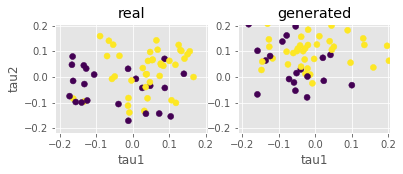

Step: 24100 of 50001.
Losses: G, D Gen, D Real: 0.6753, 0.7122, 0.6733
D Real - D Gen: -0.0389


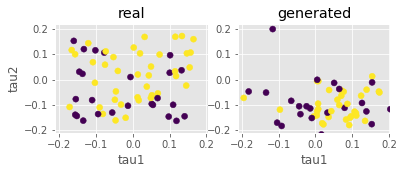

Step: 24200 of 50001.
Losses: G, D Gen, D Real: 0.6552, 0.6832, 0.6760
D Real - D Gen: -0.0072


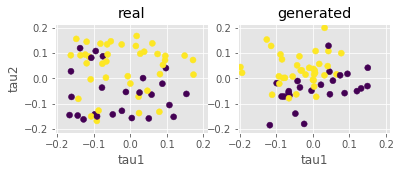

Step: 24300 of 50001.
Losses: G, D Gen, D Real: 0.6665, 0.7013, 0.6906
D Real - D Gen: -0.0107


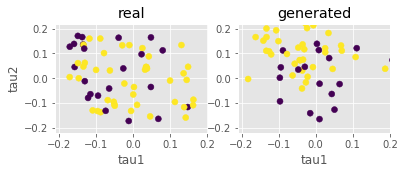

Step: 24400 of 50001.
Losses: G, D Gen, D Real: 0.6874, 0.6751, 0.6797
D Real - D Gen: 0.0046


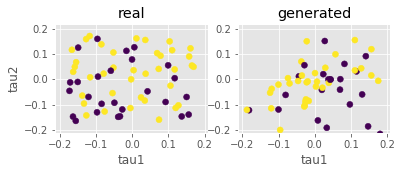

Step: 24500 of 50001.
Losses: G, D Gen, D Real: 0.6615, 0.6681, 0.6875
D Real - D Gen: 0.0194


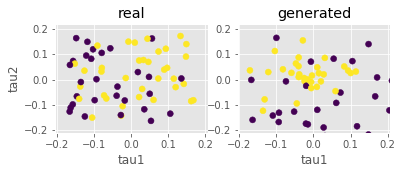

Step: 24600 of 50001.
Losses: G, D Gen, D Real: 0.6755, 0.6793, 0.6863
D Real - D Gen: 0.0070


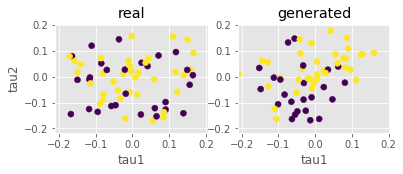

Step: 24700 of 50001.
Losses: G, D Gen, D Real: 0.6748, 0.7127, 0.6780
D Real - D Gen: -0.0347


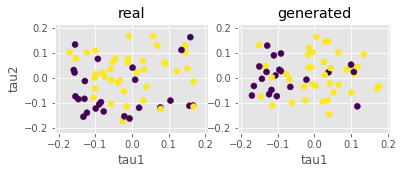

Step: 24800 of 50001.
Losses: G, D Gen, D Real: 0.6654, 0.6686, 0.6854
D Real - D Gen: 0.0168


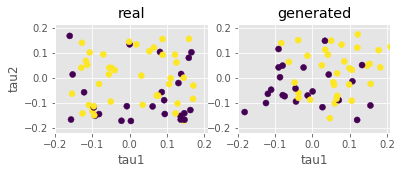

Step: 24900 of 50001.
Losses: G, D Gen, D Real: 0.6704, 0.7083, 0.6774
D Real - D Gen: -0.0309


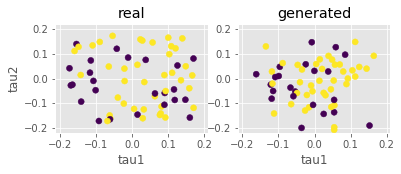

Step: 25000 of 50001.
Losses: G, D Gen, D Real: 0.6981, 0.6912, 0.6864
D Real - D Gen: -0.0048


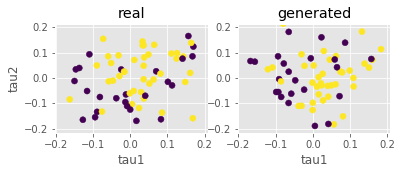

Step: 25100 of 50001.
Losses: G, D Gen, D Real: 0.6689, 0.6731, 0.6873
D Real - D Gen: 0.0142


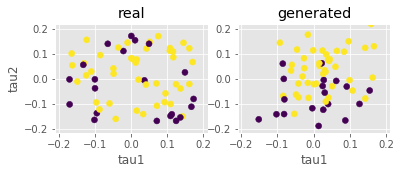

Step: 25200 of 50001.
Losses: G, D Gen, D Real: 0.6832, 0.6952, 0.6888
D Real - D Gen: -0.0064


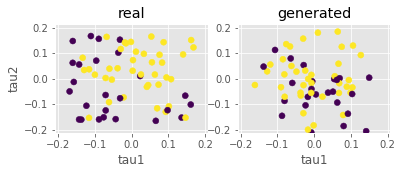

Step: 25300 of 50001.
Losses: G, D Gen, D Real: 0.6745, 0.6832, 0.6821
D Real - D Gen: -0.0011


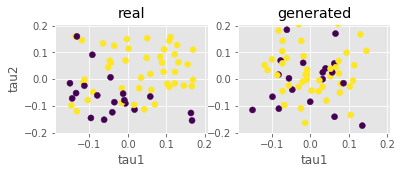

Step: 25400 of 50001.
Losses: G, D Gen, D Real: 0.6688, 0.6413, 0.7016
D Real - D Gen: 0.0603


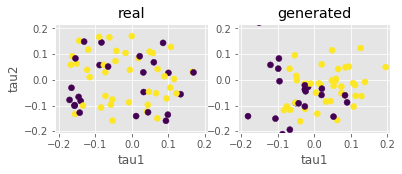

Step: 25500 of 50001.
Losses: G, D Gen, D Real: 0.6763, 0.6707, 0.6846
D Real - D Gen: 0.0139


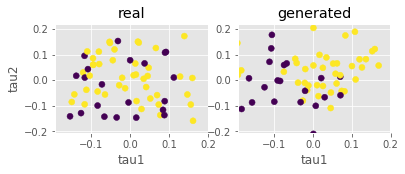

Step: 25600 of 50001.
Losses: G, D Gen, D Real: 0.6553, 0.6723, 0.6772
D Real - D Gen: 0.0049


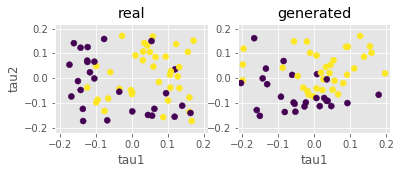

Step: 25700 of 50001.
Losses: G, D Gen, D Real: 0.6595, 0.6736, 0.6891
D Real - D Gen: 0.0155


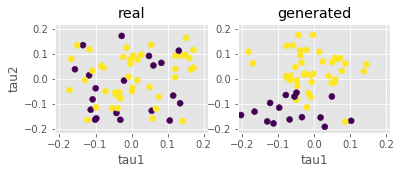

Step: 25800 of 50001.
Losses: G, D Gen, D Real: 0.6690, 0.7085, 0.6728
D Real - D Gen: -0.0357


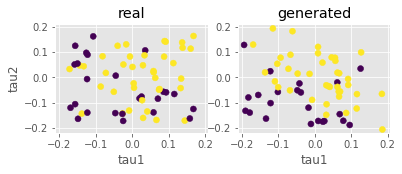

Step: 25900 of 50001.
Losses: G, D Gen, D Real: 0.6535, 0.6689, 0.6803
D Real - D Gen: 0.0115


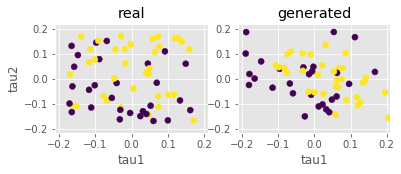

Step: 26000 of 50001.
Losses: G, D Gen, D Real: 0.6667, 0.6868, 0.6819
D Real - D Gen: -0.0048


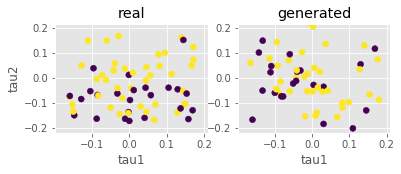

Step: 26100 of 50001.
Losses: G, D Gen, D Real: 0.8000, 0.7006, 0.6720
D Real - D Gen: -0.0286


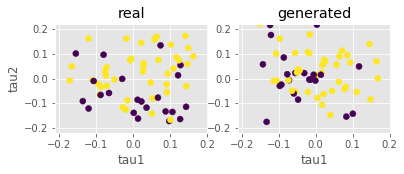

Step: 26200 of 50001.
Losses: G, D Gen, D Real: 0.6543, 0.6913, 0.6739
D Real - D Gen: -0.0174


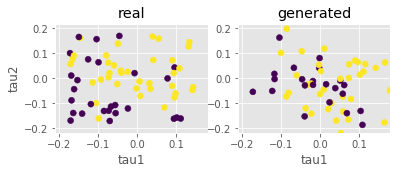

Step: 26300 of 50001.
Losses: G, D Gen, D Real: 0.6684, 0.6891, 0.6753
D Real - D Gen: -0.0138


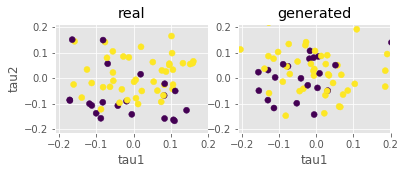

Step: 26400 of 50001.
Losses: G, D Gen, D Real: 0.6535, 0.6531, 0.6650
D Real - D Gen: 0.0119


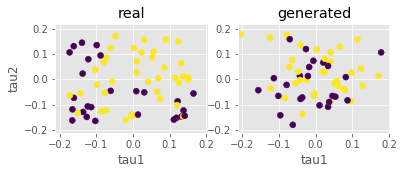

Step: 26500 of 50001.
Losses: G, D Gen, D Real: 0.6689, 0.6805, 0.6762
D Real - D Gen: -0.0043


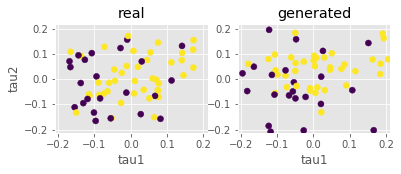

Step: 26600 of 50001.
Losses: G, D Gen, D Real: 0.6718, 0.6692, 0.6760
D Real - D Gen: 0.0068


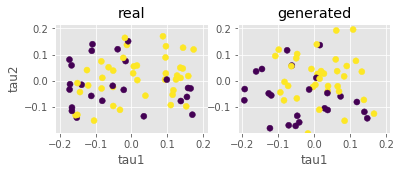

Step: 26700 of 50001.
Losses: G, D Gen, D Real: 0.6512, 0.6751, 0.6631
D Real - D Gen: -0.0120


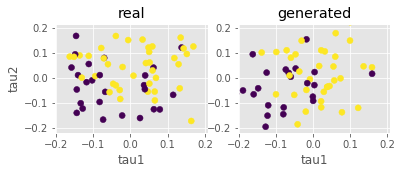

Step: 26800 of 50001.
Losses: G, D Gen, D Real: 0.6681, 0.6988, 0.6743
D Real - D Gen: -0.0245


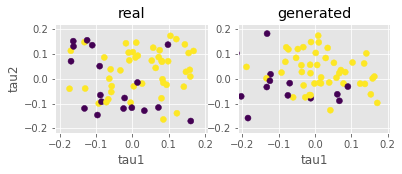

Step: 26900 of 50001.
Losses: G, D Gen, D Real: 0.6823, 0.7007, 0.6808
D Real - D Gen: -0.0198


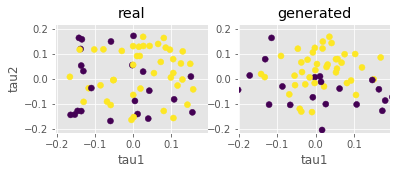

Step: 27000 of 50001.
Losses: G, D Gen, D Real: 0.6701, 0.6791, 0.6845
D Real - D Gen: 0.0055


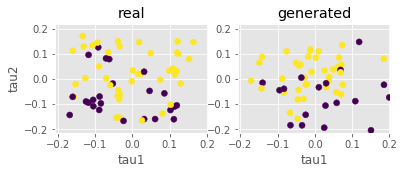

Step: 27100 of 50001.
Losses: G, D Gen, D Real: 0.6810, 0.6859, 0.6885
D Real - D Gen: 0.0026


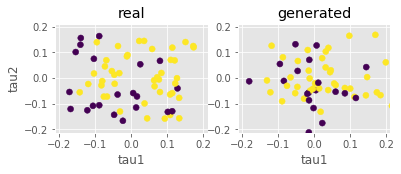

Step: 27200 of 50001.
Losses: G, D Gen, D Real: 0.7073, 0.6806, 0.6906
D Real - D Gen: 0.0100


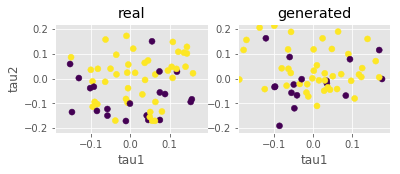

Step: 27300 of 50001.
Losses: G, D Gen, D Real: 0.6627, 0.6937, 0.6779
D Real - D Gen: -0.0158


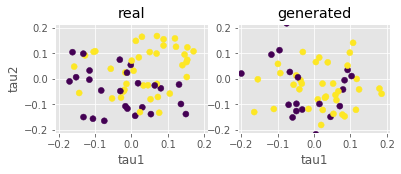

Step: 27400 of 50001.
Losses: G, D Gen, D Real: 0.6695, 0.7054, 0.6823
D Real - D Gen: -0.0231


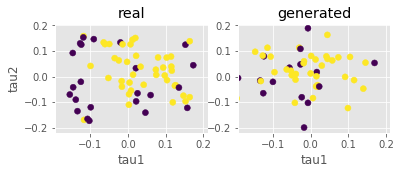

Step: 27500 of 50001.
Losses: G, D Gen, D Real: 0.7240, 0.6794, 0.6981
D Real - D Gen: 0.0186


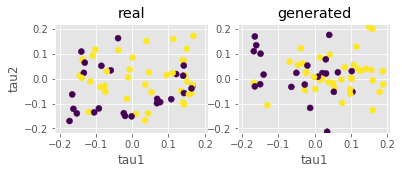

Step: 27600 of 50001.
Losses: G, D Gen, D Real: 0.6673, 0.6888, 0.6780
D Real - D Gen: -0.0108


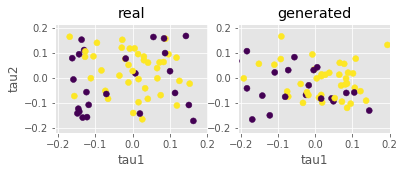

Step: 27700 of 50001.
Losses: G, D Gen, D Real: 0.6773, 0.6820, 0.6884
D Real - D Gen: 0.0064


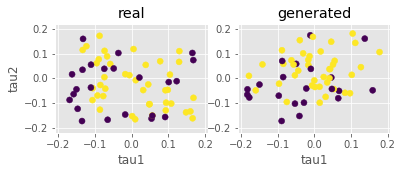

Step: 27800 of 50001.
Losses: G, D Gen, D Real: 0.6609, 0.6800, 0.6754
D Real - D Gen: -0.0046


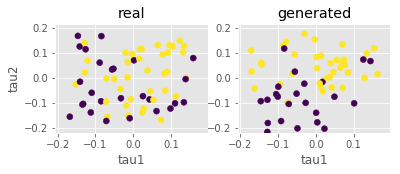

Step: 27900 of 50001.
Losses: G, D Gen, D Real: 0.6616, 0.6923, 0.6815
D Real - D Gen: -0.0108


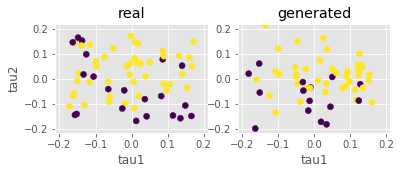

Step: 28000 of 50001.
Losses: G, D Gen, D Real: 0.6892, 0.6819, 0.6778
D Real - D Gen: -0.0041


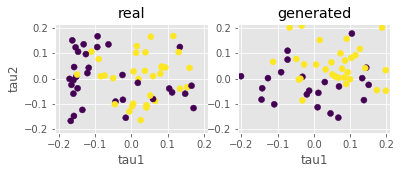

Step: 28100 of 50001.
Losses: G, D Gen, D Real: 0.6600, 0.6977, 0.6833
D Real - D Gen: -0.0144


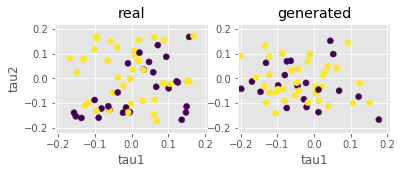

Step: 28200 of 50001.
Losses: G, D Gen, D Real: 0.6643, 0.6834, 0.6872
D Real - D Gen: 0.0038


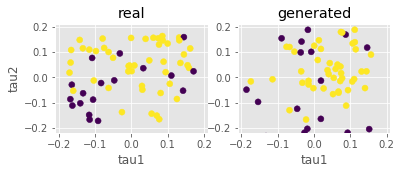

Step: 28300 of 50001.
Losses: G, D Gen, D Real: 0.6786, 0.6805, 0.6826
D Real - D Gen: 0.0021


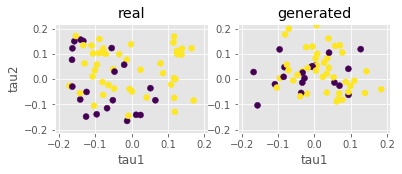

Step: 28400 of 50001.
Losses: G, D Gen, D Real: 0.6628, 0.6939, 0.6862
D Real - D Gen: -0.0077


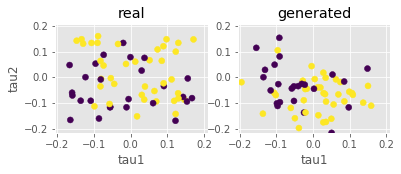

Step: 28500 of 50001.
Losses: G, D Gen, D Real: 0.6647, 0.6856, 0.6741
D Real - D Gen: -0.0115


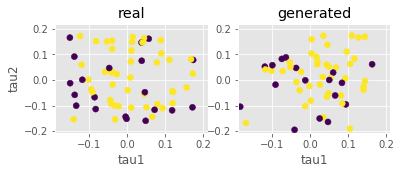

Step: 28600 of 50001.
Losses: G, D Gen, D Real: 0.7045, 0.6854, 0.6798
D Real - D Gen: -0.0056


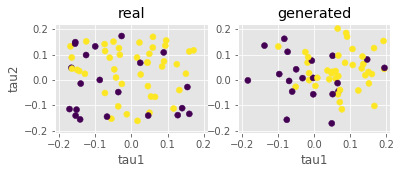

Step: 28700 of 50001.
Losses: G, D Gen, D Real: 0.6498, 0.6791, 0.6742
D Real - D Gen: -0.0050


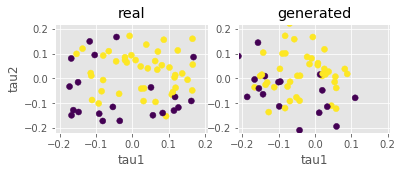

Step: 28800 of 50001.
Losses: G, D Gen, D Real: 0.6578, 0.7010, 0.6717
D Real - D Gen: -0.0293


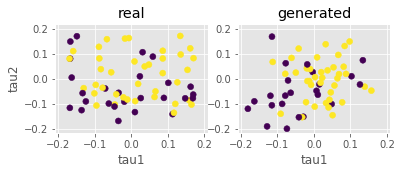

Step: 28900 of 50001.
Losses: G, D Gen, D Real: 0.6663, 0.6785, 0.6808
D Real - D Gen: 0.0022


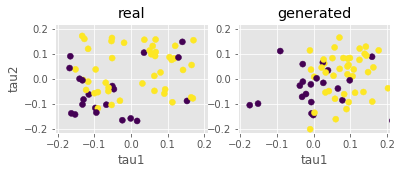

Step: 29000 of 50001.
Losses: G, D Gen, D Real: 0.6582, 0.6914, 0.7025
D Real - D Gen: 0.0111


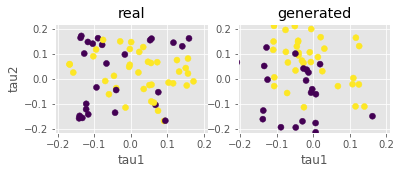

Step: 29100 of 50001.
Losses: G, D Gen, D Real: 0.6828, 0.6749, 0.6835
D Real - D Gen: 0.0086


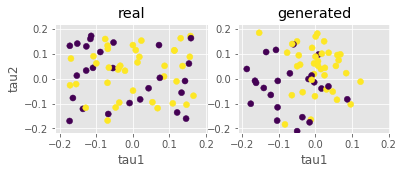

Step: 29200 of 50001.
Losses: G, D Gen, D Real: 0.6469, 0.6776, 0.6770
D Real - D Gen: -0.0006


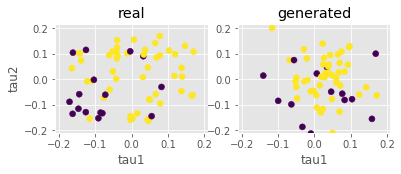

Step: 29300 of 50001.
Losses: G, D Gen, D Real: 0.6695, 0.6790, 0.6804
D Real - D Gen: 0.0014


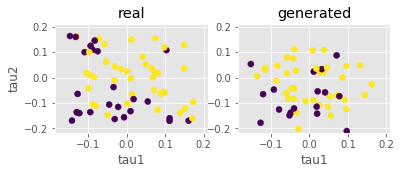

Step: 29400 of 50001.
Losses: G, D Gen, D Real: 0.6807, 0.6803, 0.6813
D Real - D Gen: 0.0010


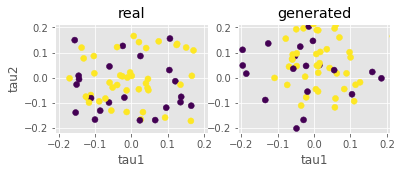

Step: 29500 of 50001.
Losses: G, D Gen, D Real: 0.6486, 0.6717, 0.6850
D Real - D Gen: 0.0132


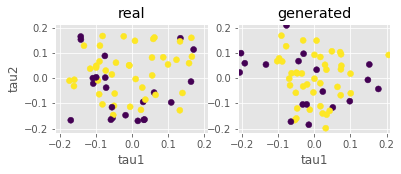

Step: 29600 of 50001.
Losses: G, D Gen, D Real: 0.6589, 0.6864, 0.6758
D Real - D Gen: -0.0106


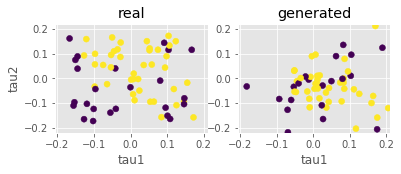

Step: 29700 of 50001.
Losses: G, D Gen, D Real: 0.6711, 0.6985, 0.6720
D Real - D Gen: -0.0265


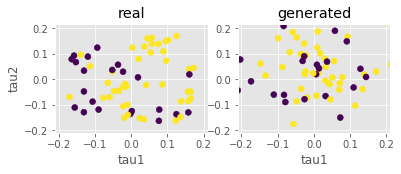

Step: 29800 of 50001.
Losses: G, D Gen, D Real: 0.6587, 0.6564, 0.6675
D Real - D Gen: 0.0111


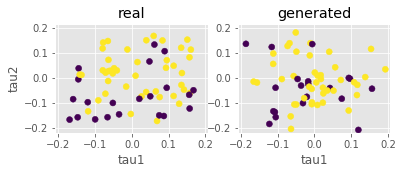

Step: 29900 of 50001.
Losses: G, D Gen, D Real: 0.6746, 0.6996, 0.6833
D Real - D Gen: -0.0163


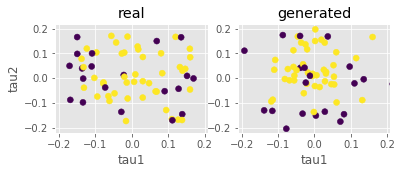

Step: 30000 of 50001.
Losses: G, D Gen, D Real: 0.7249, 0.6623, 0.6864
D Real - D Gen: 0.0241


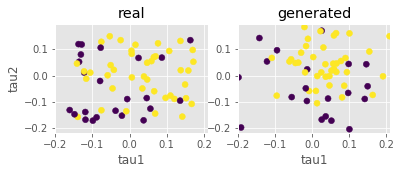

Step: 30100 of 50001.
Losses: G, D Gen, D Real: 0.6591, 0.6744, 0.6778
D Real - D Gen: 0.0034


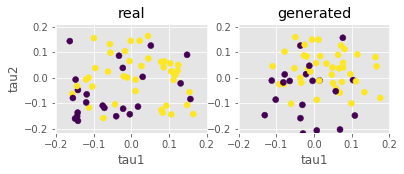

Step: 30200 of 50001.
Losses: G, D Gen, D Real: 0.6757, 0.6986, 0.6723
D Real - D Gen: -0.0263


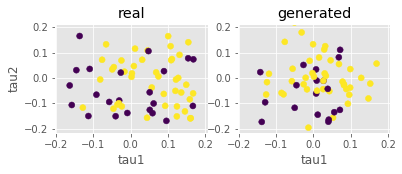

Step: 30300 of 50001.
Losses: G, D Gen, D Real: 0.6611, 0.6952, 0.6766
D Real - D Gen: -0.0185


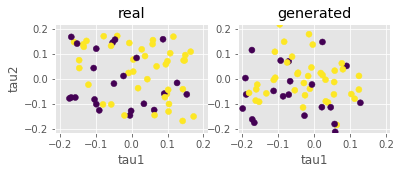

Step: 30400 of 50001.
Losses: G, D Gen, D Real: 0.6657, 0.6848, 0.6911
D Real - D Gen: 0.0063


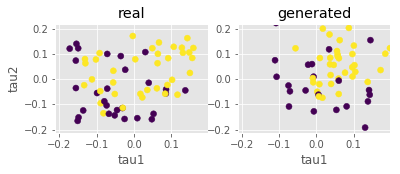

Step: 30500 of 50001.
Losses: G, D Gen, D Real: 0.6731, 0.6782, 0.6761
D Real - D Gen: -0.0021


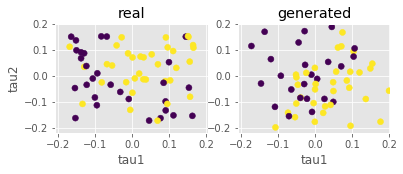

Step: 30600 of 50001.
Losses: G, D Gen, D Real: 0.6578, 0.6879, 0.6824
D Real - D Gen: -0.0056


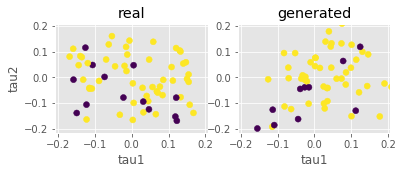

Step: 30700 of 50001.
Losses: G, D Gen, D Real: 0.6629, 0.7008, 0.6823
D Real - D Gen: -0.0185


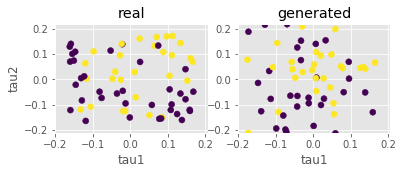

Step: 30800 of 50001.
Losses: G, D Gen, D Real: 0.6788, 0.7068, 0.6765
D Real - D Gen: -0.0303


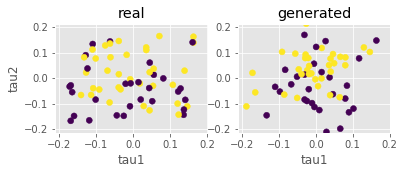

Step: 30900 of 50001.
Losses: G, D Gen, D Real: 0.6698, 0.6721, 0.6843
D Real - D Gen: 0.0122


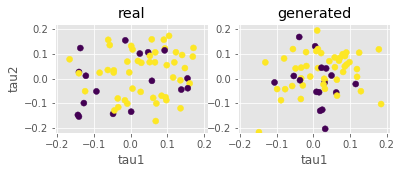

Step: 31000 of 50001.
Losses: G, D Gen, D Real: 0.6782, 0.6575, 0.6793
D Real - D Gen: 0.0218


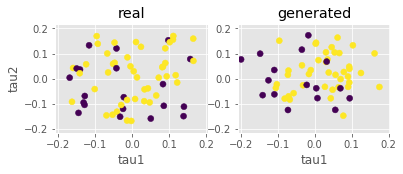

Step: 31100 of 50001.
Losses: G, D Gen, D Real: 0.6842, 0.7117, 0.6806
D Real - D Gen: -0.0312


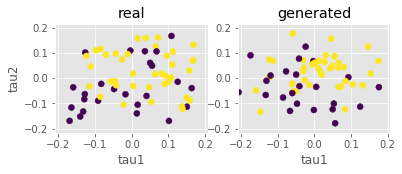

Step: 31200 of 50001.
Losses: G, D Gen, D Real: 0.6550, 0.6671, 0.6786
D Real - D Gen: 0.0115


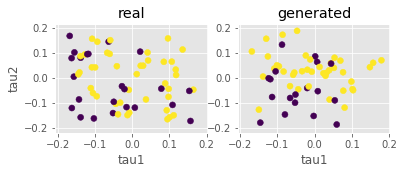

Step: 31300 of 50001.
Losses: G, D Gen, D Real: 0.6787, 0.6949, 0.6808
D Real - D Gen: -0.0141


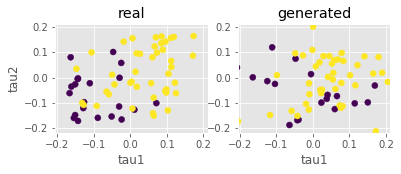

Step: 31400 of 50001.
Losses: G, D Gen, D Real: 0.6630, 0.7019, 0.6758
D Real - D Gen: -0.0260


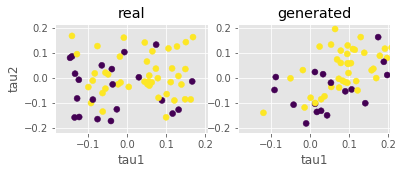

Step: 31500 of 50001.
Losses: G, D Gen, D Real: 0.6599, 0.7113, 0.6751
D Real - D Gen: -0.0362


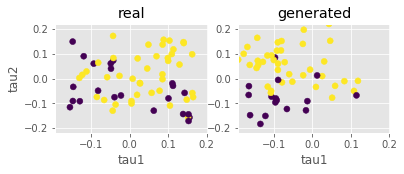

Step: 31600 of 50001.
Losses: G, D Gen, D Real: 0.6843, 0.6821, 0.6755
D Real - D Gen: -0.0066


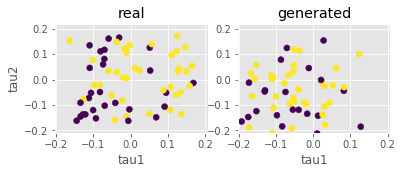

Step: 31700 of 50001.
Losses: G, D Gen, D Real: 0.6456, 0.6798, 0.6692
D Real - D Gen: -0.0106


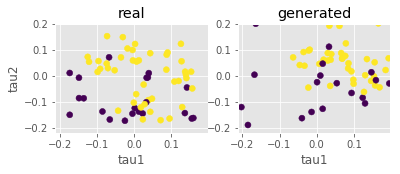

Step: 31800 of 50001.
Losses: G, D Gen, D Real: 0.6683, 0.6739, 0.6698
D Real - D Gen: -0.0041


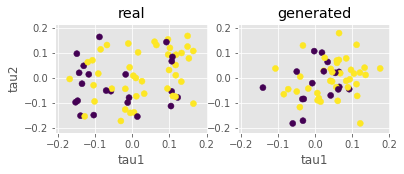

Step: 31900 of 50001.
Losses: G, D Gen, D Real: 0.6952, 0.6907, 0.6762
D Real - D Gen: -0.0145


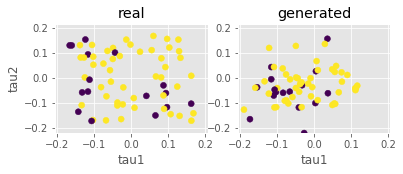

Step: 32000 of 50001.
Losses: G, D Gen, D Real: 0.6530, 0.6653, 0.6793
D Real - D Gen: 0.0140


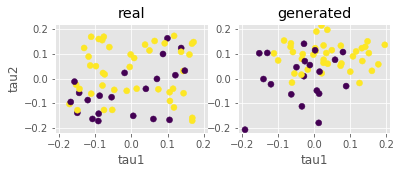

Step: 32100 of 50001.
Losses: G, D Gen, D Real: 0.6596, 0.6877, 0.6577
D Real - D Gen: -0.0300


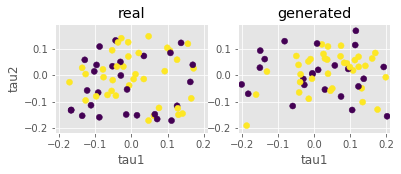

Step: 32200 of 50001.
Losses: G, D Gen, D Real: 0.6974, 0.6838, 0.6823
D Real - D Gen: -0.0014


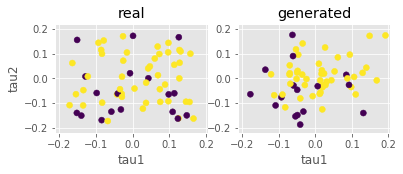

Step: 32300 of 50001.
Losses: G, D Gen, D Real: 0.6578, 0.6743, 0.6725
D Real - D Gen: -0.0018


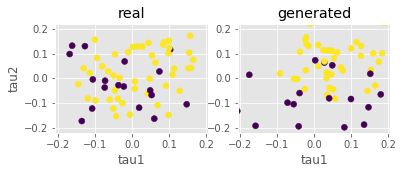

Step: 32400 of 50001.
Losses: G, D Gen, D Real: 0.6694, 0.6946, 0.6697
D Real - D Gen: -0.0248


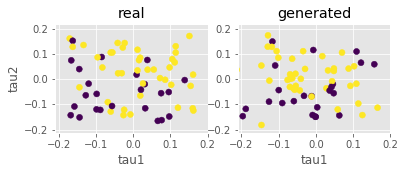

Step: 32500 of 50001.
Losses: G, D Gen, D Real: 0.7528, 0.6864, 0.6730
D Real - D Gen: -0.0134


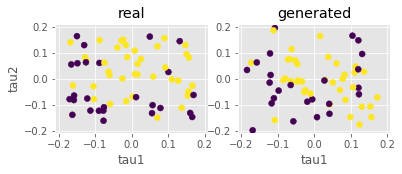

Step: 32600 of 50001.
Losses: G, D Gen, D Real: 0.6636, 0.6507, 0.6642
D Real - D Gen: 0.0135


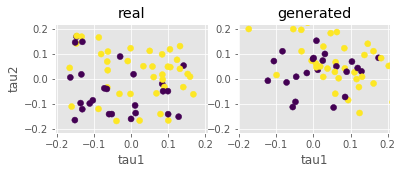

Step: 32700 of 50001.
Losses: G, D Gen, D Real: 0.6759, 0.6593, 0.6691
D Real - D Gen: 0.0098


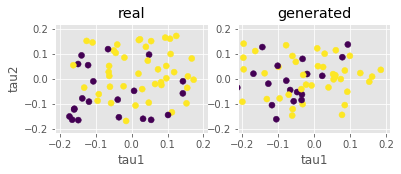

Step: 32800 of 50001.
Losses: G, D Gen, D Real: 0.6424, 0.6923, 0.6595
D Real - D Gen: -0.0328


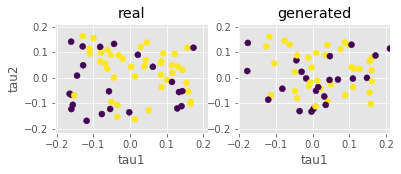

Step: 32900 of 50001.
Losses: G, D Gen, D Real: 0.6711, 0.6625, 0.6671
D Real - D Gen: 0.0047


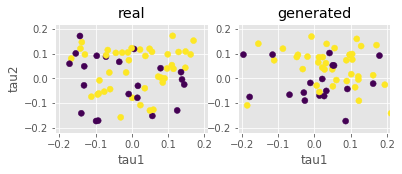

Step: 33000 of 50001.
Losses: G, D Gen, D Real: 0.6669, 0.7136, 0.6588
D Real - D Gen: -0.0548


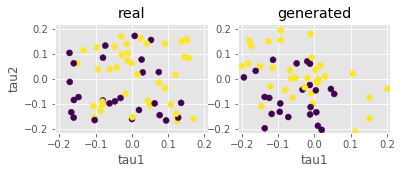

Step: 33100 of 50001.
Losses: G, D Gen, D Real: 0.6538, 0.6930, 0.6652
D Real - D Gen: -0.0278


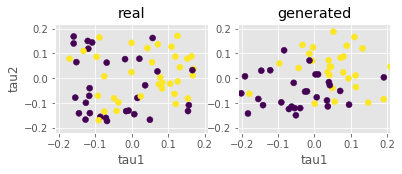

Step: 33200 of 50001.
Losses: G, D Gen, D Real: 0.6524, 0.6768, 0.6725
D Real - D Gen: -0.0043


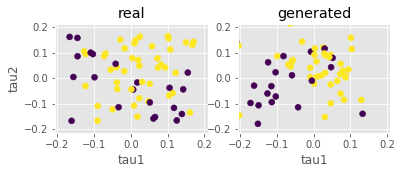

Step: 33300 of 50001.
Losses: G, D Gen, D Real: 0.6765, 0.6876, 0.6657
D Real - D Gen: -0.0219


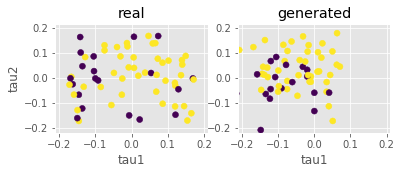

Step: 33400 of 50001.
Losses: G, D Gen, D Real: 0.6499, 0.6711, 0.6823
D Real - D Gen: 0.0112


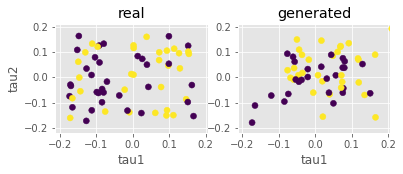

Step: 33500 of 50001.
Losses: G, D Gen, D Real: 0.6569, 0.6951, 0.6753
D Real - D Gen: -0.0198


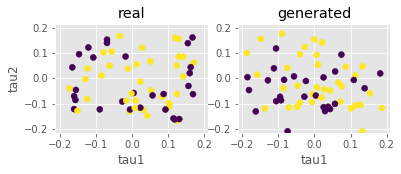

Step: 33600 of 50001.
Losses: G, D Gen, D Real: 0.9352, 0.6808, 0.6822
D Real - D Gen: 0.0015


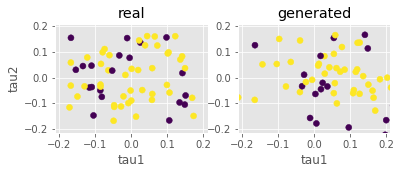

Step: 33700 of 50001.
Losses: G, D Gen, D Real: 0.6572, 0.6771, 0.7022
D Real - D Gen: 0.0251


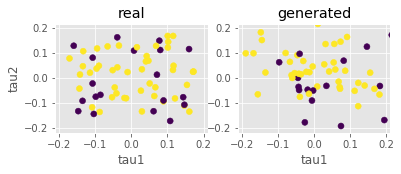

Step: 33800 of 50001.
Losses: G, D Gen, D Real: 0.6679, 0.6760, 0.6796
D Real - D Gen: 0.0037


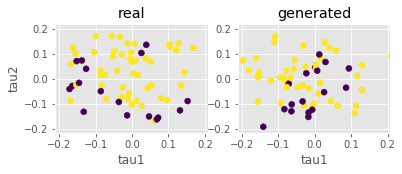

Step: 33900 of 50001.
Losses: G, D Gen, D Real: 0.6225, 0.6724, 0.6741
D Real - D Gen: 0.0017


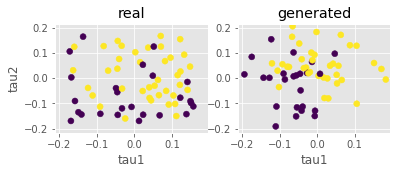

Step: 34000 of 50001.
Losses: G, D Gen, D Real: 0.6489, 0.6797, 0.6690
D Real - D Gen: -0.0107


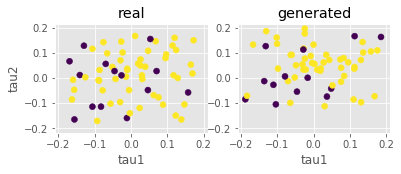

Step: 34100 of 50001.
Losses: G, D Gen, D Real: 0.6727, 0.7046, 0.6639
D Real - D Gen: -0.0407


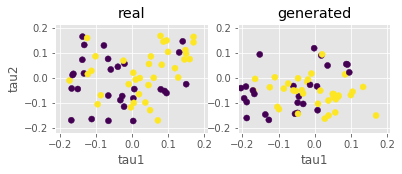

Step: 34200 of 50001.
Losses: G, D Gen, D Real: 0.6479, 0.6573, 0.6698
D Real - D Gen: 0.0125


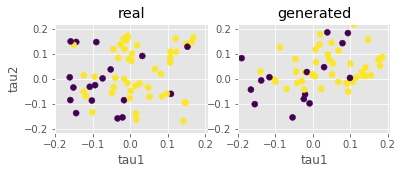

Step: 34300 of 50001.
Losses: G, D Gen, D Real: 0.6626, 0.6757, 0.6784
D Real - D Gen: 0.0027


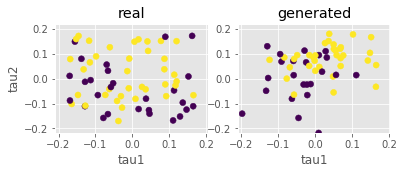

Step: 34400 of 50001.
Losses: G, D Gen, D Real: 0.6858, 0.6943, 0.6821
D Real - D Gen: -0.0122


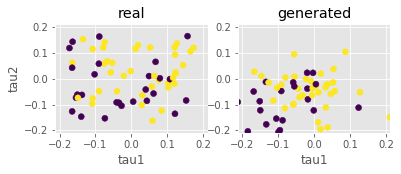

Step: 34500 of 50001.
Losses: G, D Gen, D Real: 0.7137, 0.6299, 0.6842
D Real - D Gen: 0.0543


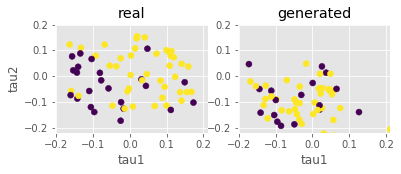

Step: 34600 of 50001.
Losses: G, D Gen, D Real: 0.6309, 0.6960, 0.6606
D Real - D Gen: -0.0354


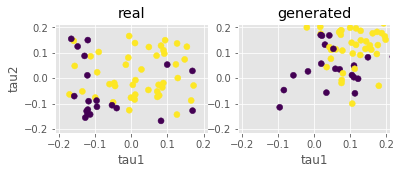

Step: 34700 of 50001.
Losses: G, D Gen, D Real: 0.6483, 0.7434, 0.6483
D Real - D Gen: -0.0951


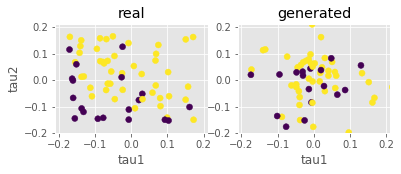

Step: 34800 of 50001.
Losses: G, D Gen, D Real: 0.6485, 0.6688, 0.6666
D Real - D Gen: -0.0021


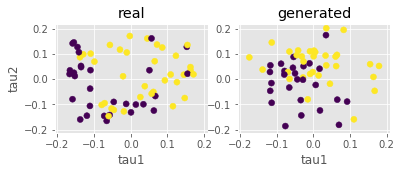

Step: 34900 of 50001.
Losses: G, D Gen, D Real: 0.6535, 0.7003, 0.6598
D Real - D Gen: -0.0405


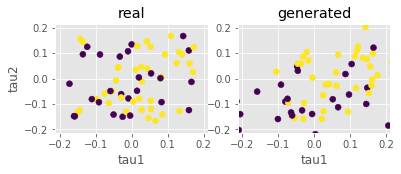

Step: 35000 of 50001.
Losses: G, D Gen, D Real: 0.9494, 0.6723, 0.6739
D Real - D Gen: 0.0016


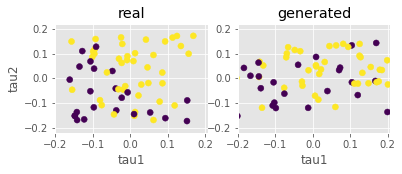

Step: 35100 of 50001.
Losses: G, D Gen, D Real: 0.6513, 0.6320, 0.6688
D Real - D Gen: 0.0368


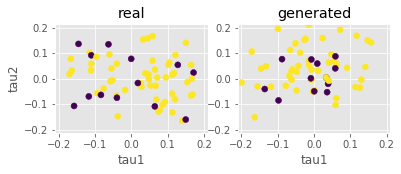

Step: 35200 of 50001.
Losses: G, D Gen, D Real: 0.6651, 0.6908, 0.6747
D Real - D Gen: -0.0161


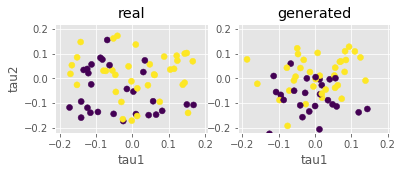

Step: 35300 of 50001.
Losses: G, D Gen, D Real: 0.6358, 0.6593, 0.6667
D Real - D Gen: 0.0074


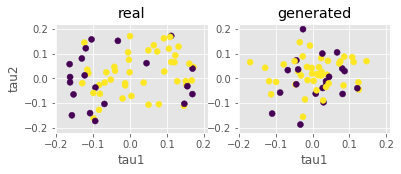

Step: 35400 of 50001.
Losses: G, D Gen, D Real: 0.6557, 0.6467, 0.6713
D Real - D Gen: 0.0245


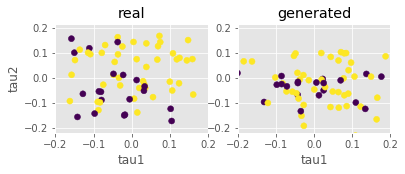

Step: 35500 of 50001.
Losses: G, D Gen, D Real: 0.6749, 0.6913, 0.6857
D Real - D Gen: -0.0056


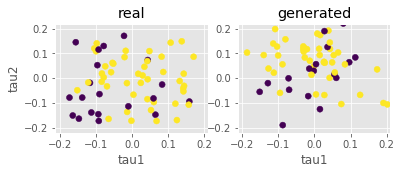

Step: 35600 of 50001.
Losses: G, D Gen, D Real: 0.6396, 0.6660, 0.6598
D Real - D Gen: -0.0062


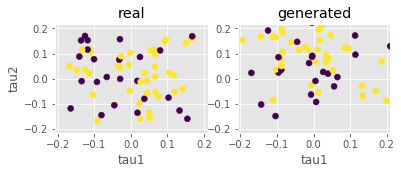

Step: 35700 of 50001.
Losses: G, D Gen, D Real: 0.6395, 0.7152, 0.6649
D Real - D Gen: -0.0503


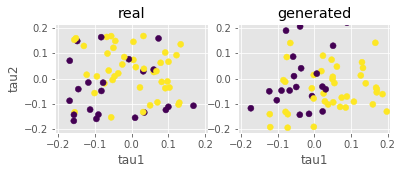

Step: 35800 of 50001.
Losses: G, D Gen, D Real: 0.6972, 0.6918, 0.6657
D Real - D Gen: -0.0261


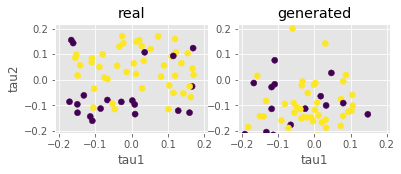

Step: 35900 of 50001.
Losses: G, D Gen, D Real: 0.6472, 0.6894, 0.6812
D Real - D Gen: -0.0081


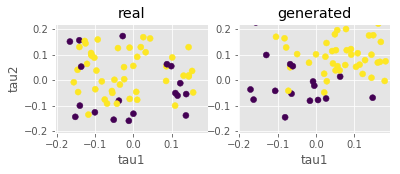

Step: 36000 of 50001.
Losses: G, D Gen, D Real: 0.6576, 0.6921, 0.6707
D Real - D Gen: -0.0214


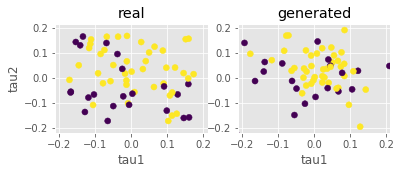

Step: 36100 of 50001.
Losses: G, D Gen, D Real: 0.6820, 0.7120, 0.6679
D Real - D Gen: -0.0441


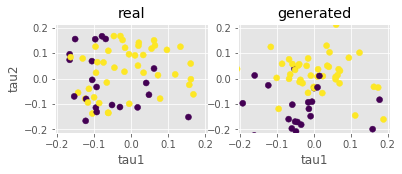

Step: 36200 of 50001.
Losses: G, D Gen, D Real: 0.6517, 0.6740, 0.6921
D Real - D Gen: 0.0181


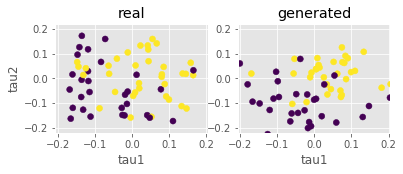

Step: 36300 of 50001.
Losses: G, D Gen, D Real: 0.6790, 0.6729, 0.6763
D Real - D Gen: 0.0034


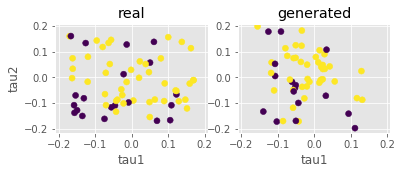

Step: 36400 of 50001.
Losses: G, D Gen, D Real: 0.6453, 0.6814, 0.6736
D Real - D Gen: -0.0078


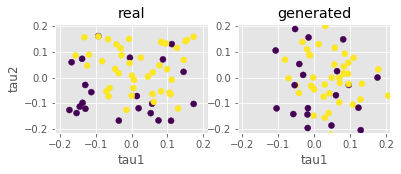

Step: 36500 of 50001.
Losses: G, D Gen, D Real: 0.6501, 0.6713, 0.6694
D Real - D Gen: -0.0019


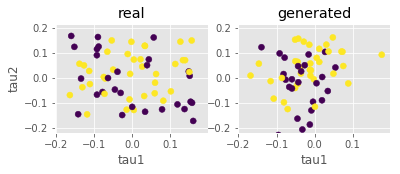

Step: 36600 of 50001.
Losses: G, D Gen, D Real: 0.6721, 0.6887, 0.6838
D Real - D Gen: -0.0049


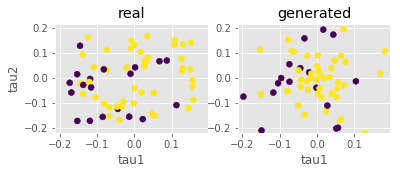

Step: 36700 of 50001.
Losses: G, D Gen, D Real: 0.6310, 0.6613, 0.6564
D Real - D Gen: -0.0049


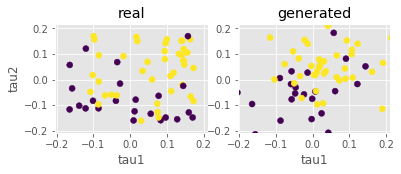

Step: 36800 of 50001.
Losses: G, D Gen, D Real: 0.6505, 0.6738, 0.6657
D Real - D Gen: -0.0081


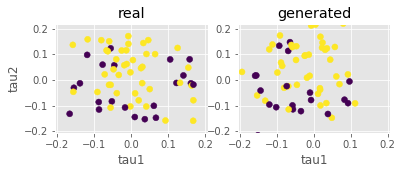

Step: 36900 of 50001.
Losses: G, D Gen, D Real: 0.6600, 0.6802, 0.6719
D Real - D Gen: -0.0083


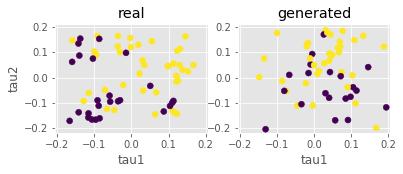

Step: 37000 of 50001.
Losses: G, D Gen, D Real: 0.6254, 0.6260, 0.6721
D Real - D Gen: 0.0461


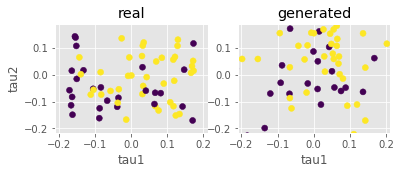

Step: 37100 of 50001.
Losses: G, D Gen, D Real: 0.6682, 0.6788, 0.6647
D Real - D Gen: -0.0140


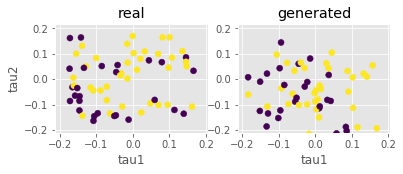

Step: 37200 of 50001.
Losses: G, D Gen, D Real: 0.6784, 0.6920, 0.6748
D Real - D Gen: -0.0172


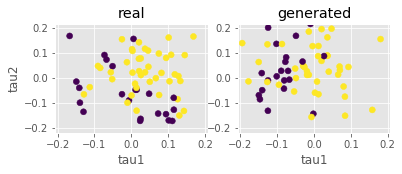

Step: 37300 of 50001.
Losses: G, D Gen, D Real: 0.6492, 0.6861, 0.6836
D Real - D Gen: -0.0025


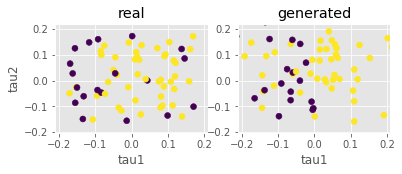

Step: 37400 of 50001.
Losses: G, D Gen, D Real: 0.6585, 0.6811, 0.6642
D Real - D Gen: -0.0169


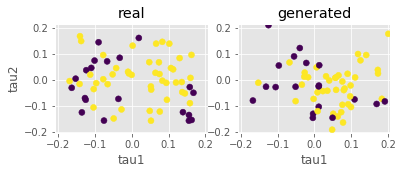

Step: 37500 of 50001.
Losses: G, D Gen, D Real: 1.1321, 0.6509, 0.6786
D Real - D Gen: 0.0276


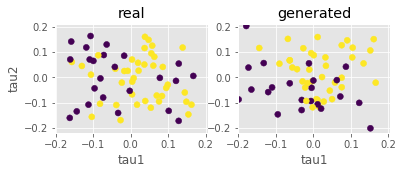

Step: 37600 of 50001.
Losses: G, D Gen, D Real: 0.6340, 0.6646, 0.6733
D Real - D Gen: 0.0087


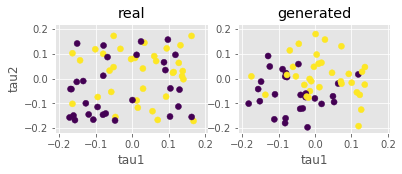

Step: 37700 of 50001.
Losses: G, D Gen, D Real: 0.6582, 0.6951, 0.6716
D Real - D Gen: -0.0234


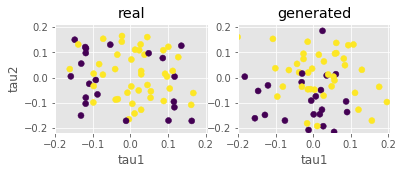

Step: 37800 of 50001.
Losses: G, D Gen, D Real: 0.6353, 0.6845, 0.6623
D Real - D Gen: -0.0223


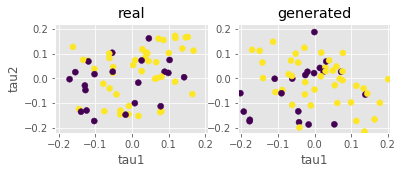

Step: 37900 of 50001.
Losses: G, D Gen, D Real: 0.6440, 0.6770, 0.6729
D Real - D Gen: -0.0041


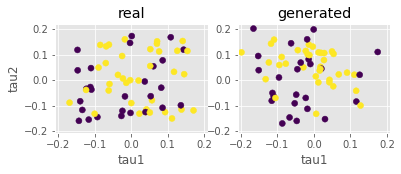

Step: 38000 of 50001.
Losses: G, D Gen, D Real: 0.6617, 0.7262, 0.6569
D Real - D Gen: -0.0692


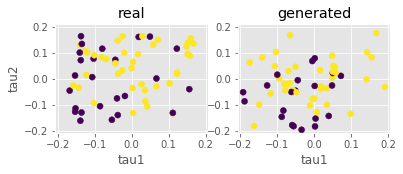

Step: 38100 of 50001.
Losses: G, D Gen, D Real: 0.6473, 0.6863, 0.6596
D Real - D Gen: -0.0267


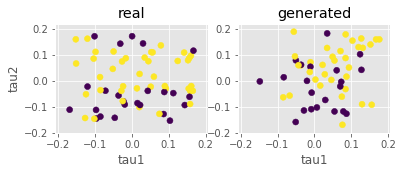

Step: 38200 of 50001.
Losses: G, D Gen, D Real: 0.6434, 0.6568, 0.6720
D Real - D Gen: 0.0152


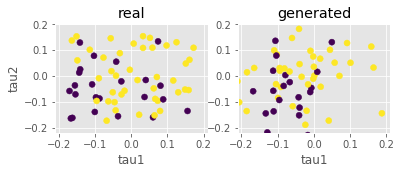

Step: 38300 of 50001.
Losses: G, D Gen, D Real: 0.6686, 0.6570, 0.6564
D Real - D Gen: -0.0006


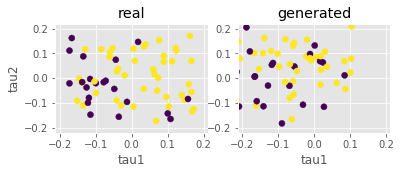

Step: 38400 of 50001.
Losses: G, D Gen, D Real: 0.6252, 0.6715, 0.6966
D Real - D Gen: 0.0250


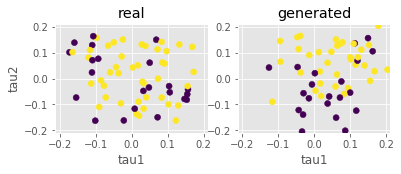

Step: 38500 of 50001.
Losses: G, D Gen, D Real: 0.6553, 0.7024, 0.6620
D Real - D Gen: -0.0404


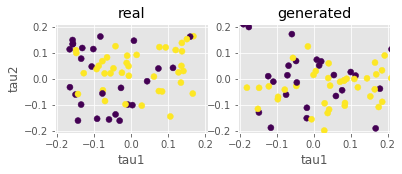

Step: 38600 of 50001.
Losses: G, D Gen, D Real: 0.6874, 0.7059, 0.6617
D Real - D Gen: -0.0442


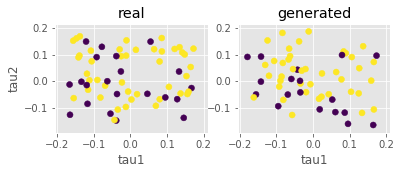

Step: 38700 of 50001.
Losses: G, D Gen, D Real: 0.6421, 0.6918, 0.6620
D Real - D Gen: -0.0298


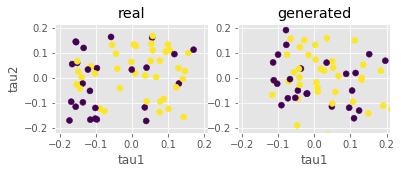

Step: 38800 of 50001.
Losses: G, D Gen, D Real: 0.6619, 0.6943, 0.6873
D Real - D Gen: -0.0070


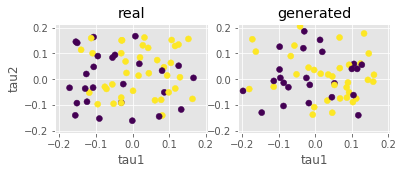

Step: 38900 of 50001.
Losses: G, D Gen, D Real: 0.6410, 0.6707, 0.6678
D Real - D Gen: -0.0029


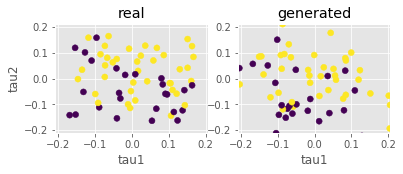

Step: 39000 of 50001.
Losses: G, D Gen, D Real: 0.6301, 0.6482, 0.6857
D Real - D Gen: 0.0374


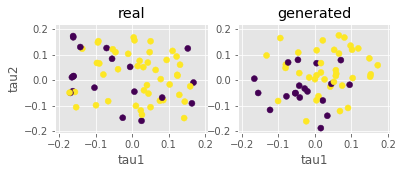

Step: 39100 of 50001.
Losses: G, D Gen, D Real: 0.6670, 0.7005, 0.6627
D Real - D Gen: -0.0377


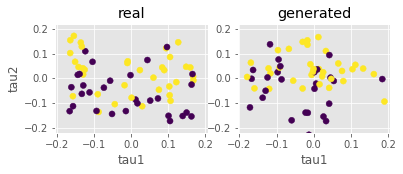

Step: 39200 of 50001.
Losses: G, D Gen, D Real: 0.6297, 0.6521, 0.6628
D Real - D Gen: 0.0107


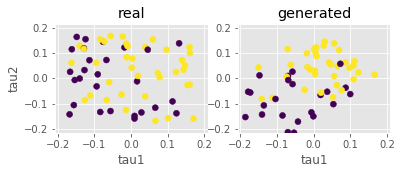

Step: 39300 of 50001.
Losses: G, D Gen, D Real: 0.6458, 0.6506, 0.6636
D Real - D Gen: 0.0130


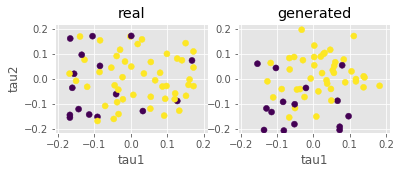

Step: 39400 of 50001.
Losses: G, D Gen, D Real: 0.6803, 0.6916, 0.6623
D Real - D Gen: -0.0293


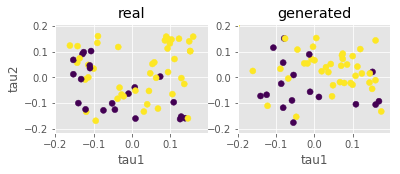

Step: 39500 of 50001.
Losses: G, D Gen, D Real: 0.6341, 0.6611, 0.6534
D Real - D Gen: -0.0076


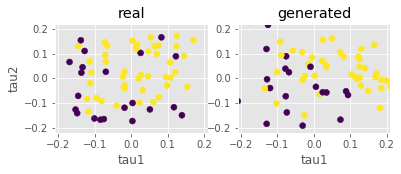

Step: 39600 of 50001.
Losses: G, D Gen, D Real: 0.6445, 0.7088, 0.6606
D Real - D Gen: -0.0482


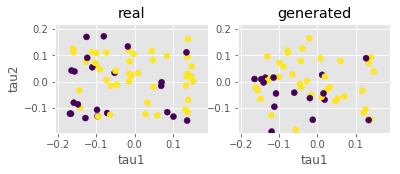

Step: 39700 of 50001.
Losses: G, D Gen, D Real: 0.7034, 0.6781, 0.6767
D Real - D Gen: -0.0014


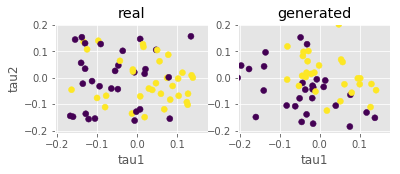

Step: 39800 of 50001.
Losses: G, D Gen, D Real: 0.6238, 0.6454, 0.6552
D Real - D Gen: 0.0098


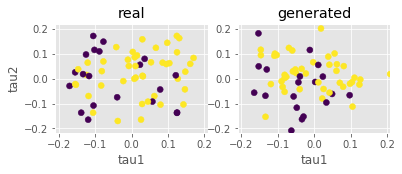

Step: 39900 of 50001.
Losses: G, D Gen, D Real: 0.6600, 0.6965, 0.6509
D Real - D Gen: -0.0456


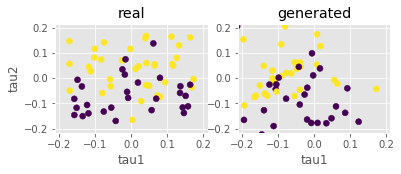

Step: 40000 of 50001.
Losses: G, D Gen, D Real: 1.0816, 0.6204, 0.6630
D Real - D Gen: 0.0427


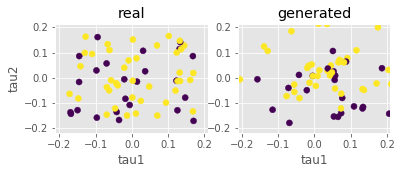

Step: 40100 of 50001.
Losses: G, D Gen, D Real: 0.6481, 0.6608, 0.6704
D Real - D Gen: 0.0095


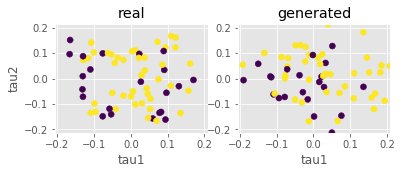

Step: 40200 of 50001.
Losses: G, D Gen, D Real: 0.6531, 0.6894, 0.6584
D Real - D Gen: -0.0309


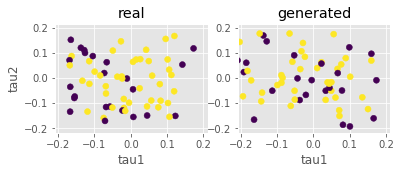

Step: 40300 of 50001.
Losses: G, D Gen, D Real: 0.8699, 0.6624, 0.6774
D Real - D Gen: 0.0150


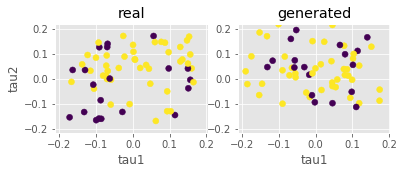

Step: 40400 of 50001.
Losses: G, D Gen, D Real: 0.6322, 0.6616, 0.6628
D Real - D Gen: 0.0012


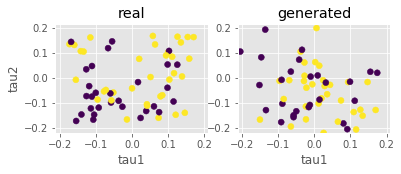

Step: 40500 of 50001.
Losses: G, D Gen, D Real: 0.6671, 0.6988, 0.6601
D Real - D Gen: -0.0387


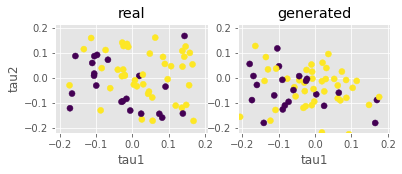

Step: 40600 of 50001.
Losses: G, D Gen, D Real: 0.6426, 0.6850, 0.6689
D Real - D Gen: -0.0161


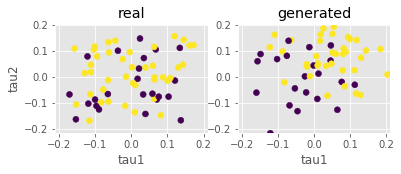

Step: 40700 of 50001.
Losses: G, D Gen, D Real: 0.6552, 0.6611, 0.6609
D Real - D Gen: -0.0002


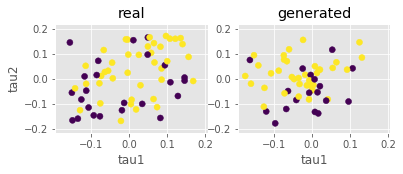

Step: 40800 of 50001.
Losses: G, D Gen, D Real: 0.6766, 0.7085, 0.6616
D Real - D Gen: -0.0470


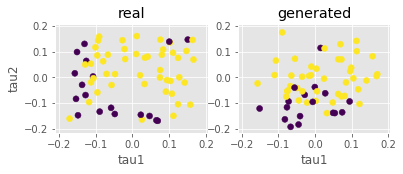

Step: 40900 of 50001.
Losses: G, D Gen, D Real: 0.6500, 0.6638, 0.6865
D Real - D Gen: 0.0227


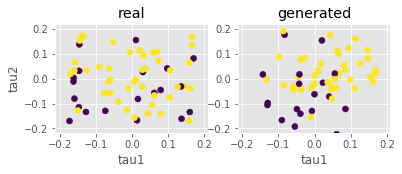

Step: 41000 of 50001.
Losses: G, D Gen, D Real: 0.6561, 0.6788, 0.6635
D Real - D Gen: -0.0153


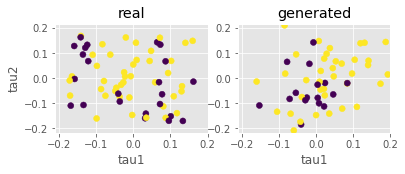

Step: 41100 of 50001.
Losses: G, D Gen, D Real: 0.9423, 0.6738, 0.6964
D Real - D Gen: 0.0227


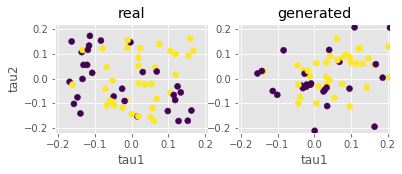

Step: 41200 of 50001.
Losses: G, D Gen, D Real: 0.6693, 0.6529, 0.6577
D Real - D Gen: 0.0048


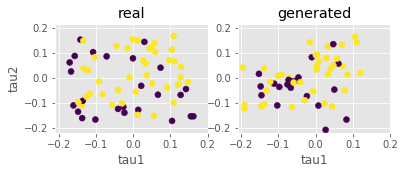

Step: 41300 of 50001.
Losses: G, D Gen, D Real: 0.6653, 0.6668, 0.6856
D Real - D Gen: 0.0188


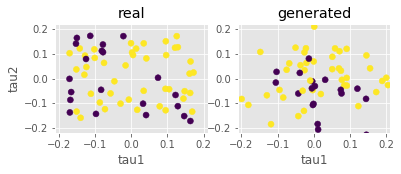

Step: 41400 of 50001.
Losses: G, D Gen, D Real: 0.6260, 0.6758, 0.6812
D Real - D Gen: 0.0054


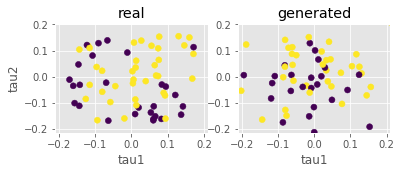

Step: 41500 of 50001.
Losses: G, D Gen, D Real: 0.6357, 0.6261, 0.6661
D Real - D Gen: 0.0400


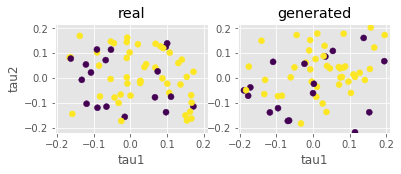

Step: 41600 of 50001.
Losses: G, D Gen, D Real: 0.6461, 0.7136, 0.6547
D Real - D Gen: -0.0589


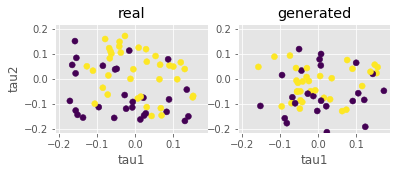

Step: 41700 of 50001.
Losses: G, D Gen, D Real: 0.6226, 0.6825, 0.6725
D Real - D Gen: -0.0099


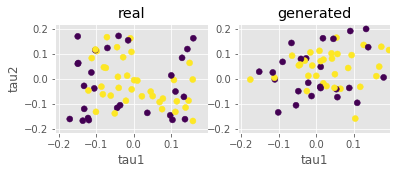

Step: 41800 of 50001.
Losses: G, D Gen, D Real: 0.6313, 0.6943, 0.6576
D Real - D Gen: -0.0367


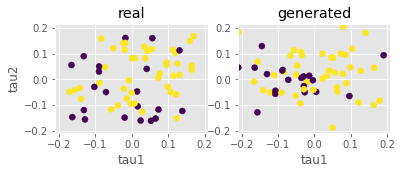

Step: 41900 of 50001.
Losses: G, D Gen, D Real: 0.6816, 0.6774, 0.6746
D Real - D Gen: -0.0028


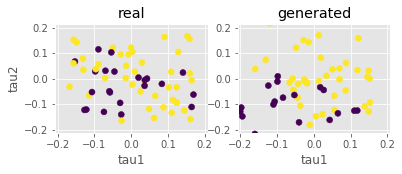

Step: 42000 of 50001.
Losses: G, D Gen, D Real: 0.6201, 0.6819, 0.6686
D Real - D Gen: -0.0133


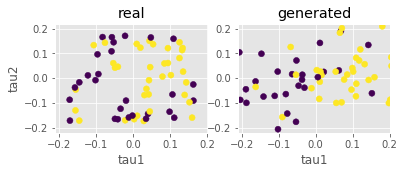

Step: 42100 of 50001.
Losses: G, D Gen, D Real: 0.6512, 0.7067, 0.6626
D Real - D Gen: -0.0441


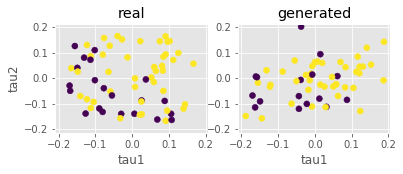

Step: 42200 of 50001.
Losses: G, D Gen, D Real: 0.6980, 0.6599, 0.6714
D Real - D Gen: 0.0115


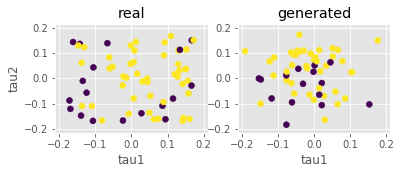

Step: 42300 of 50001.
Losses: G, D Gen, D Real: 0.6320, 0.6759, 0.6781
D Real - D Gen: 0.0022


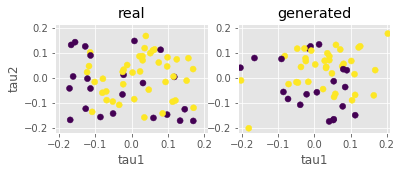

Step: 42400 of 50001.
Losses: G, D Gen, D Real: 0.6527, 0.6921, 0.6625
D Real - D Gen: -0.0297


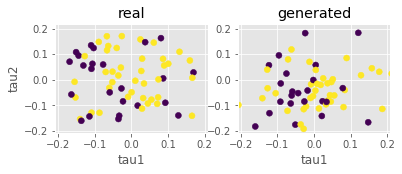

Step: 42500 of 50001.
Losses: G, D Gen, D Real: 1.0074, 0.6266, 0.6459
D Real - D Gen: 0.0193


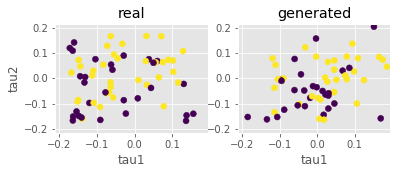

Step: 42600 of 50001.
Losses: G, D Gen, D Real: 0.6243, 0.6656, 0.6634
D Real - D Gen: -0.0022


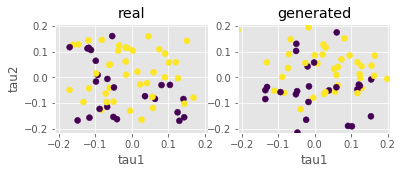

Step: 42700 of 50001.
Losses: G, D Gen, D Real: 0.6484, 0.6792, 0.6614
D Real - D Gen: -0.0178


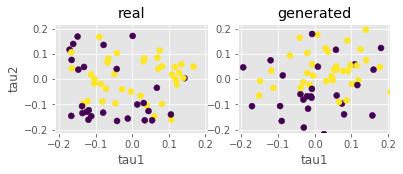

Step: 42800 of 50001.
Losses: G, D Gen, D Real: 0.6218, 0.6501, 0.6679
D Real - D Gen: 0.0178


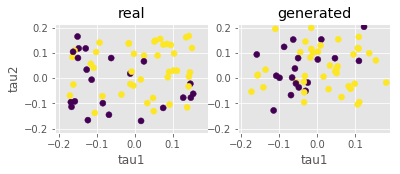

Step: 42900 of 50001.
Losses: G, D Gen, D Real: 0.6435, 0.6823, 0.6765
D Real - D Gen: -0.0058


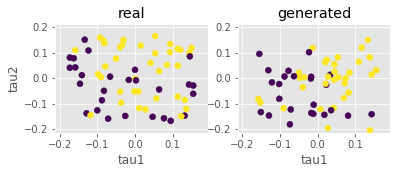

Step: 43000 of 50001.
Losses: G, D Gen, D Real: 0.6716, 0.6946, 0.6629
D Real - D Gen: -0.0318


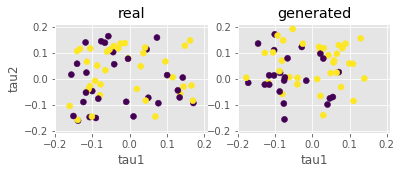

Step: 43100 of 50001.
Losses: G, D Gen, D Real: 0.6292, 0.6606, 0.6671
D Real - D Gen: 0.0064


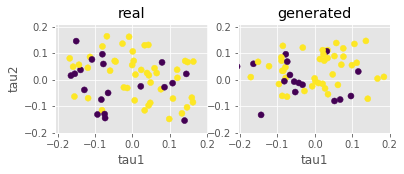

Step: 43200 of 50001.
Losses: G, D Gen, D Real: 0.6536, 0.6518, 0.6624
D Real - D Gen: 0.0106


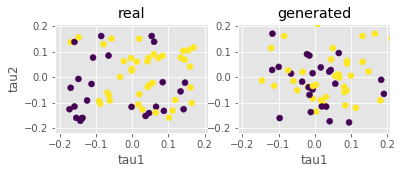

Step: 43300 of 50001.
Losses: G, D Gen, D Real: 0.6809, 0.6757, 0.6588
D Real - D Gen: -0.0169


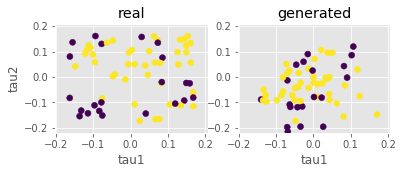

Step: 43400 of 50001.
Losses: G, D Gen, D Real: 0.6321, 0.6579, 0.6674
D Real - D Gen: 0.0096


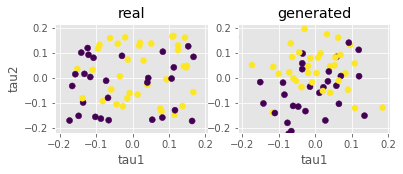

Step: 43500 of 50001.
Losses: G, D Gen, D Real: 0.6409, 0.6931, 0.6542
D Real - D Gen: -0.0389


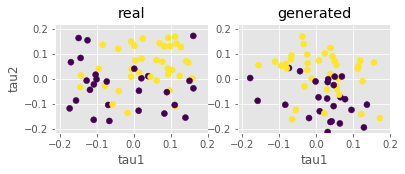

Step: 43600 of 50001.
Losses: G, D Gen, D Real: 0.7634, 0.6893, 0.6796
D Real - D Gen: -0.0098


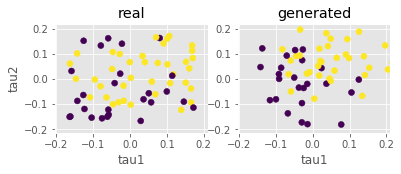

Step: 43700 of 50001.
Losses: G, D Gen, D Real: 0.6502, 0.6491, 0.6632
D Real - D Gen: 0.0141


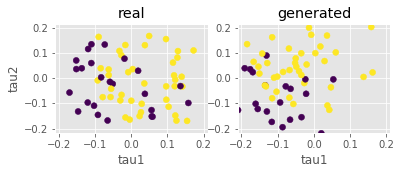

Step: 43800 of 50001.
Losses: G, D Gen, D Real: 0.6561, 0.6988, 0.6730
D Real - D Gen: -0.0259


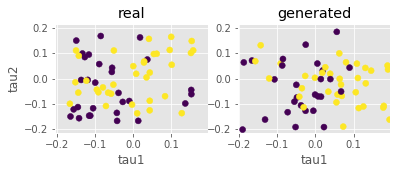

Step: 43900 of 50001.
Losses: G, D Gen, D Real: 0.6338, 0.6610, 0.6765
D Real - D Gen: 0.0155


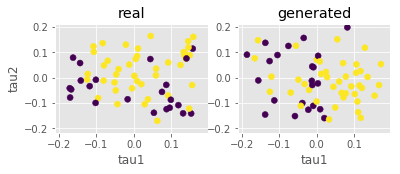

Step: 44000 of 50001.
Losses: G, D Gen, D Real: 0.6278, 0.6285, 0.6681
D Real - D Gen: 0.0396


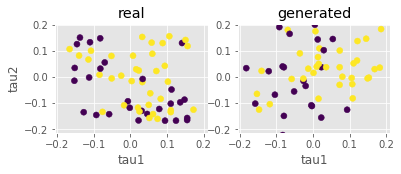

Step: 44100 of 50001.
Losses: G, D Gen, D Real: 0.6560, 0.6985, 0.6514
D Real - D Gen: -0.0471


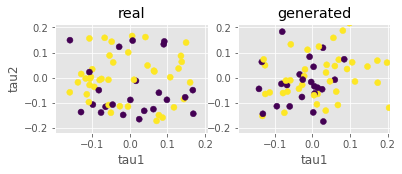

Step: 44200 of 50001.
Losses: G, D Gen, D Real: 0.6157, 0.6870, 0.6497
D Real - D Gen: -0.0373


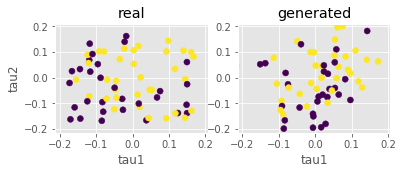

Step: 44300 of 50001.
Losses: G, D Gen, D Real: 0.6304, 0.6869, 0.6569
D Real - D Gen: -0.0300


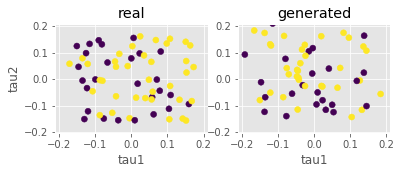

Step: 44400 of 50001.
Losses: G, D Gen, D Real: 0.6747, 0.6860, 0.6548
D Real - D Gen: -0.0312


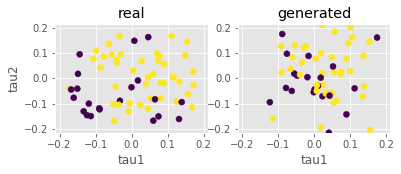

Step: 44500 of 50001.
Losses: G, D Gen, D Real: 0.6369, 0.6566, 0.6675
D Real - D Gen: 0.0109


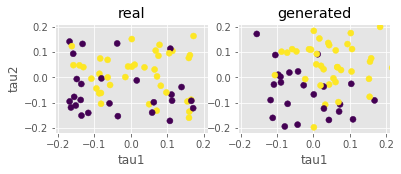

Step: 44600 of 50001.
Losses: G, D Gen, D Real: 0.6619, 0.6865, 0.6607
D Real - D Gen: -0.0257


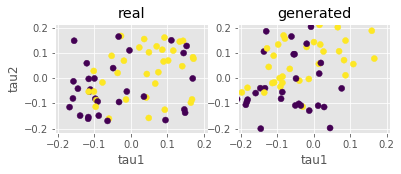

Step: 44700 of 50001.
Losses: G, D Gen, D Real: 0.7061, 0.6548, 0.6908
D Real - D Gen: 0.0360


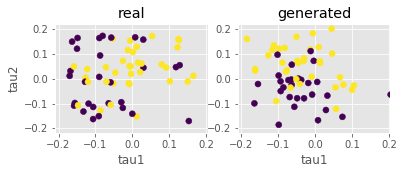

Step: 44800 of 50001.
Losses: G, D Gen, D Real: 0.6397, 0.6619, 0.6708
D Real - D Gen: 0.0089


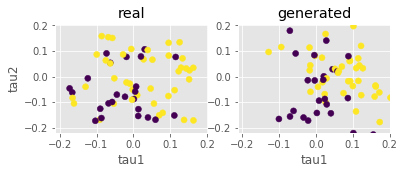

Step: 44900 of 50001.
Losses: G, D Gen, D Real: 0.6664, 0.6695, 0.6778
D Real - D Gen: 0.0082


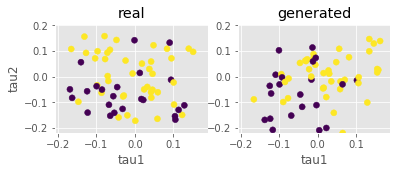

Step: 45000 of 50001.
Losses: G, D Gen, D Real: 0.7536, 0.6672, 0.6811
D Real - D Gen: 0.0139


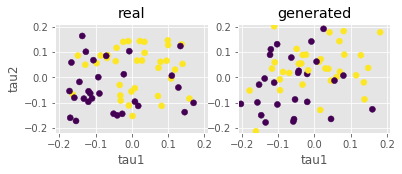

Step: 45100 of 50001.
Losses: G, D Gen, D Real: 0.8701, 0.6484, 0.6703
D Real - D Gen: 0.0219


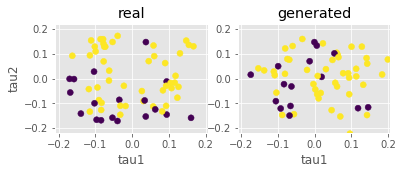

Step: 45200 of 50001.
Losses: G, D Gen, D Real: 0.6804, 0.6748, 0.6672
D Real - D Gen: -0.0076


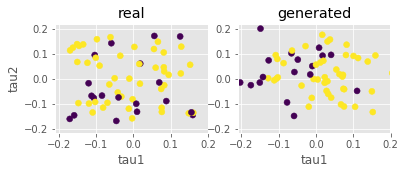

Step: 45300 of 50001.
Losses: G, D Gen, D Real: 0.6301, 0.6647, 0.6709
D Real - D Gen: 0.0063


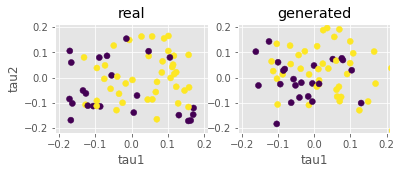

Step: 45400 of 50001.
Losses: G, D Gen, D Real: 0.6404, 0.6432, 0.6589
D Real - D Gen: 0.0157


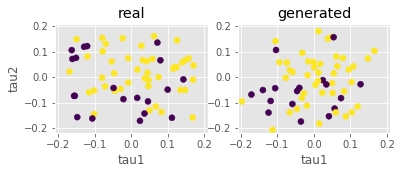

Step: 45500 of 50001.
Losses: G, D Gen, D Real: 0.6516, 0.7091, 0.6463
D Real - D Gen: -0.0628


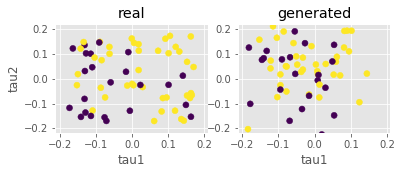

Step: 45600 of 50001.
Losses: G, D Gen, D Real: 0.6261, 0.6340, 0.6825
D Real - D Gen: 0.0485


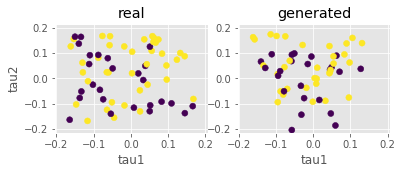

Step: 45700 of 50001.
Losses: G, D Gen, D Real: 0.6369, 0.6719, 0.6543
D Real - D Gen: -0.0176


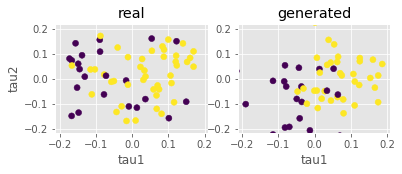

Step: 45800 of 50001.
Losses: G, D Gen, D Real: 0.6883, 0.6872, 0.6599
D Real - D Gen: -0.0273


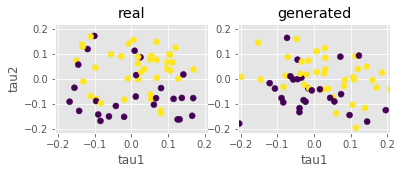

Step: 45900 of 50001.
Losses: G, D Gen, D Real: 0.6412, 0.6753, 0.6652
D Real - D Gen: -0.0101


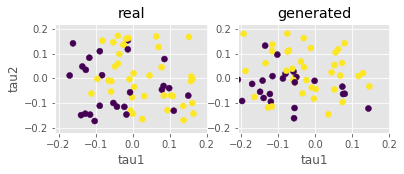

Step: 46000 of 50001.
Losses: G, D Gen, D Real: 0.6673, 0.6344, 0.6771
D Real - D Gen: 0.0427


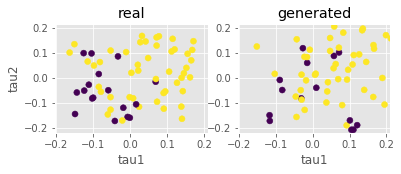

Step: 46100 of 50001.
Losses: G, D Gen, D Real: 0.6994, 0.6604, 0.6819
D Real - D Gen: 0.0215


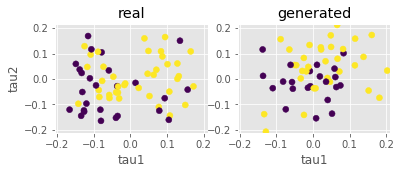

Step: 46200 of 50001.
Losses: G, D Gen, D Real: 0.6086, 0.6406, 0.6621
D Real - D Gen: 0.0215


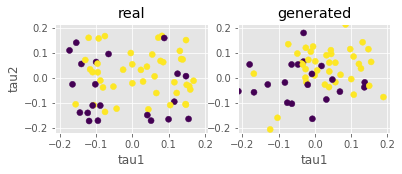

Step: 46300 of 50001.
Losses: G, D Gen, D Real: 0.6427, 0.6869, 0.6542
D Real - D Gen: -0.0327


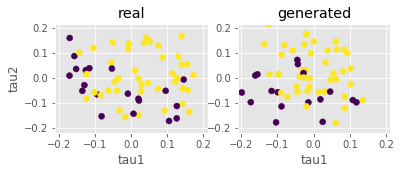

Step: 46400 of 50001.
Losses: G, D Gen, D Real: 0.6085, 0.6577, 0.6625
D Real - D Gen: 0.0048


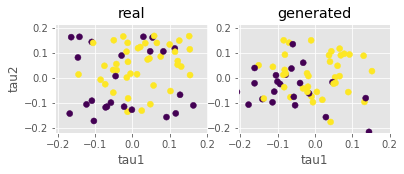

Step: 46500 of 50001.
Losses: G, D Gen, D Real: 0.6471, 0.6822, 0.6528
D Real - D Gen: -0.0295


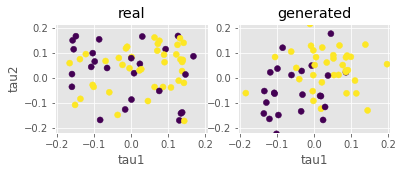

Step: 46600 of 50001.
Losses: G, D Gen, D Real: 0.6385, 0.6808, 0.6616
D Real - D Gen: -0.0193


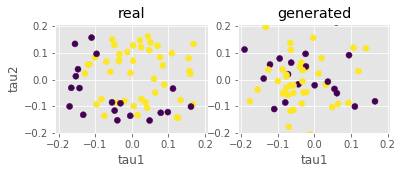

Step: 46700 of 50001.
Losses: G, D Gen, D Real: 0.6015, 0.6609, 0.6436
D Real - D Gen: -0.0173


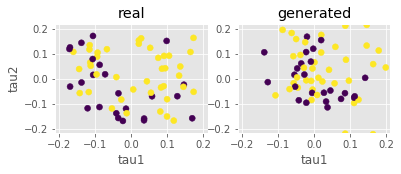

Step: 46800 of 50001.
Losses: G, D Gen, D Real: 0.6325, 0.6667, 0.6577
D Real - D Gen: -0.0090


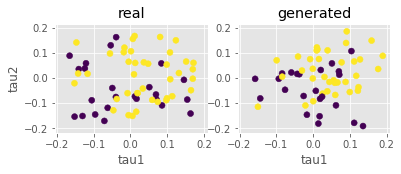

Step: 46900 of 50001.
Losses: G, D Gen, D Real: 0.6699, 0.6909, 0.6473
D Real - D Gen: -0.0436


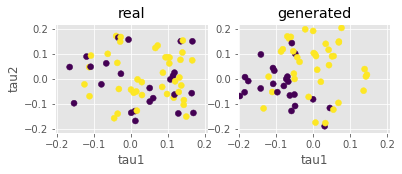

Step: 47000 of 50001.
Losses: G, D Gen, D Real: 0.6244, 0.6309, 0.6660
D Real - D Gen: 0.0351


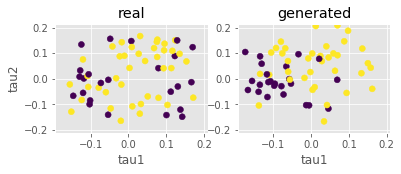

Step: 47100 of 50001.
Losses: G, D Gen, D Real: 0.6391, 0.6908, 0.6627
D Real - D Gen: -0.0281


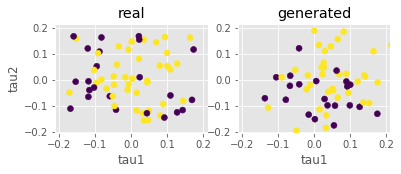

Step: 47200 of 50001.
Losses: G, D Gen, D Real: 0.7182, 0.6712, 0.6730
D Real - D Gen: 0.0017


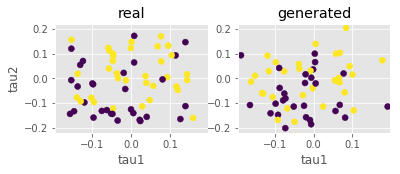

Step: 47300 of 50001.
Losses: G, D Gen, D Real: 0.6252, 0.6485, 0.6748
D Real - D Gen: 0.0263


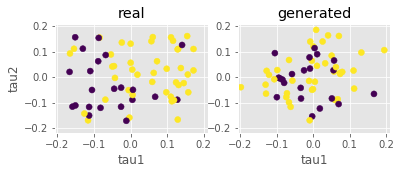

Step: 47400 of 50001.
Losses: G, D Gen, D Real: 0.6455, 0.6652, 0.6581
D Real - D Gen: -0.0071


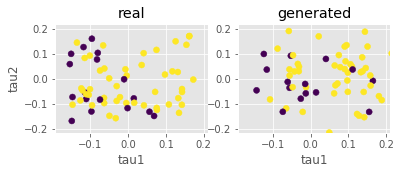

Step: 47500 of 50001.
Losses: G, D Gen, D Real: 0.7724, 0.6402, 0.6849
D Real - D Gen: 0.0447


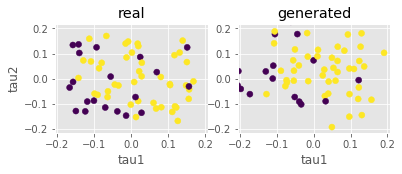

Step: 47600 of 50001.
Losses: G, D Gen, D Real: 0.6282, 0.6726, 0.6561
D Real - D Gen: -0.0165


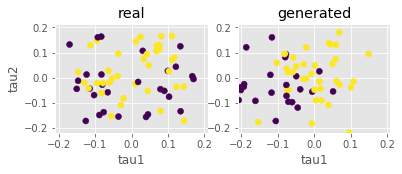

Step: 47700 of 50001.
Losses: G, D Gen, D Real: 0.6483, 0.6825, 0.6659
D Real - D Gen: -0.0166


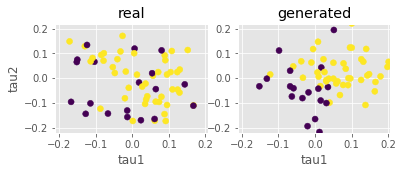

Step: 47800 of 50001.
Losses: G, D Gen, D Real: 0.6551, 0.6522, 0.6613
D Real - D Gen: 0.0091


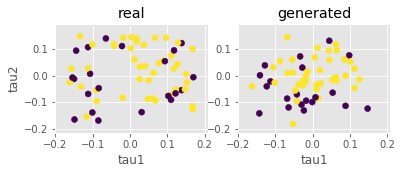

Step: 47900 of 50001.
Losses: G, D Gen, D Real: 0.6303, 0.6974, 0.6490
D Real - D Gen: -0.0484


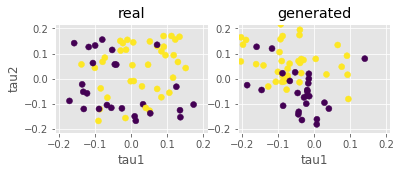

Step: 48000 of 50001.
Losses: G, D Gen, D Real: 0.6411, 0.6908, 0.6735
D Real - D Gen: -0.0173


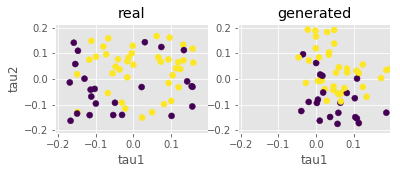

Step: 48100 of 50001.
Losses: G, D Gen, D Real: 0.6134, 0.6037, 0.6548
D Real - D Gen: 0.0510


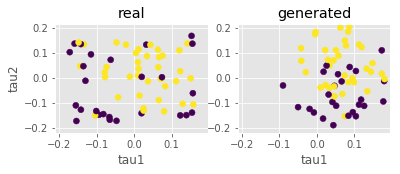

Step: 48200 of 50001.
Losses: G, D Gen, D Real: 0.6428, 0.7035, 0.6488
D Real - D Gen: -0.0547


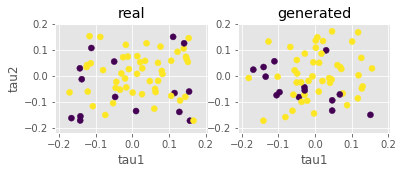

Step: 48300 of 50001.
Losses: G, D Gen, D Real: 0.7977, 0.6884, 0.6416
D Real - D Gen: -0.0468


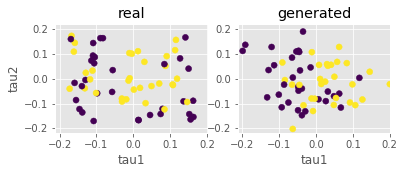

Step: 48400 of 50001.
Losses: G, D Gen, D Real: 0.6163, 0.6686, 0.6543
D Real - D Gen: -0.0143


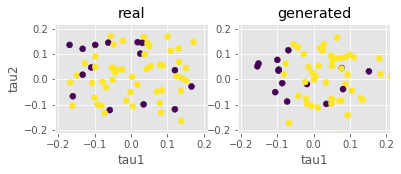

Step: 48500 of 50001.
Losses: G, D Gen, D Real: 0.6478, 0.6550, 0.6446
D Real - D Gen: -0.0105


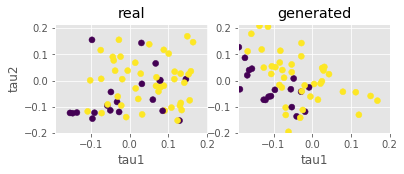

Step: 48600 of 50001.
Losses: G, D Gen, D Real: 0.6722, 0.7027, 0.6621
D Real - D Gen: -0.0406


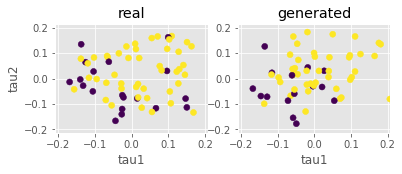

Step: 48700 of 50001.
Losses: G, D Gen, D Real: 0.6346, 0.6619, 0.6629
D Real - D Gen: 0.0010


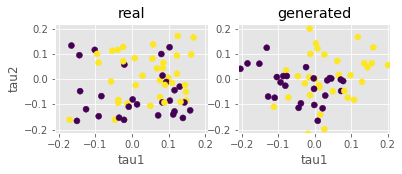

Step: 48800 of 50001.
Losses: G, D Gen, D Real: 0.6505, 0.6664, 0.6498
D Real - D Gen: -0.0166


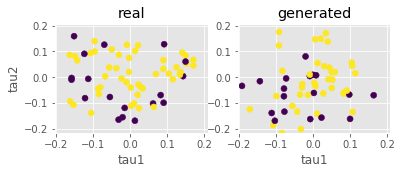

Step: 48900 of 50001.
Losses: G, D Gen, D Real: 0.6070, 0.6282, 0.6753
D Real - D Gen: 0.0471


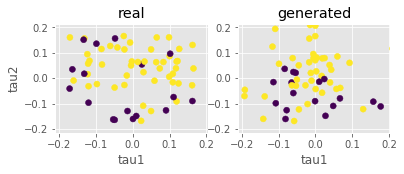

Step: 49000 of 50001.
Losses: G, D Gen, D Real: 0.5955, 0.6400, 0.6548
D Real - D Gen: 0.0148


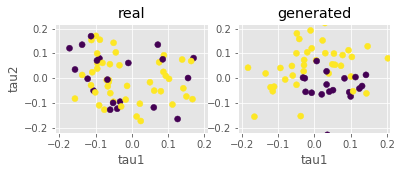

Step: 49100 of 50001.
Losses: G, D Gen, D Real: 0.6289, 0.7288, 0.6542
D Real - D Gen: -0.0746


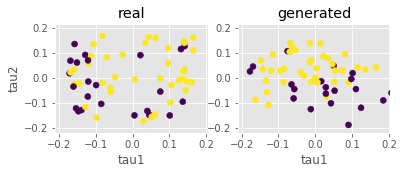

Step: 49200 of 50001.
Losses: G, D Gen, D Real: 0.6182, 0.6525, 0.6605
D Real - D Gen: 0.0080


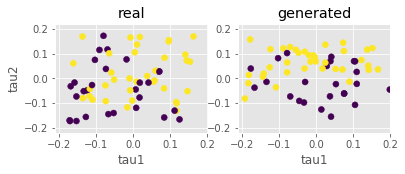

Step: 49300 of 50001.
Losses: G, D Gen, D Real: 0.6101, 0.5667, 0.6548
D Real - D Gen: 0.0881


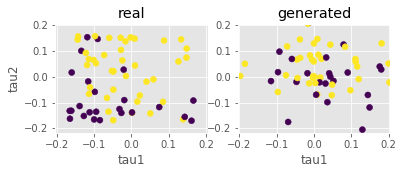

Step: 49400 of 50001.
Losses: G, D Gen, D Real: 0.6391, 0.6737, 0.6446
D Real - D Gen: -0.0291


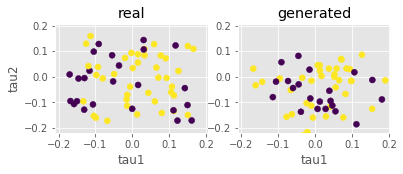

Step: 49500 of 50001.
Losses: G, D Gen, D Real: 0.5844, 0.6137, 0.6392
D Real - D Gen: 0.0255


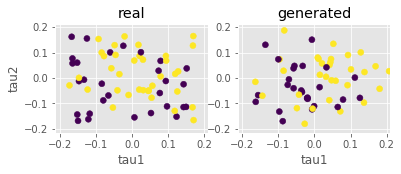

Step: 49600 of 50001.
Losses: G, D Gen, D Real: 0.6083, 0.6934, 0.6401
D Real - D Gen: -0.0533


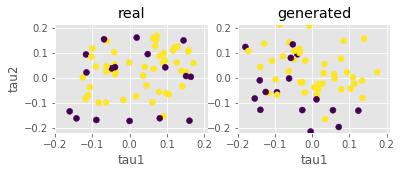

Step: 49700 of 50001.
Losses: G, D Gen, D Real: 0.6569, 0.7083, 0.6404
D Real - D Gen: -0.0679


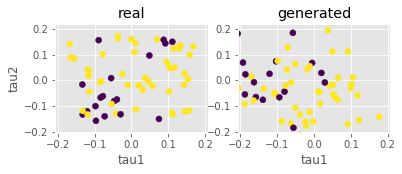

Step: 49800 of 50001.
Losses: G, D Gen, D Real: 0.6137, 0.6398, 0.6483
D Real - D Gen: 0.0085


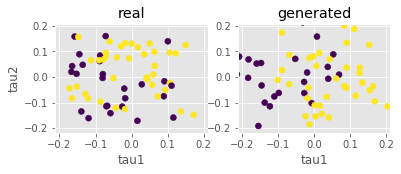

Step: 49900 of 50001.
Losses: G, D Gen, D Real: 0.6341, 0.6658, 0.6610
D Real - D Gen: -0.0049


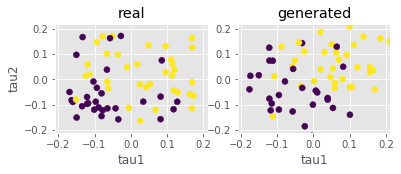

Step: 50000 of 50001.
Losses: G, D Gen, D Real: 0.9236, 0.6445, 0.6625
D Real - D Gen: 0.0180


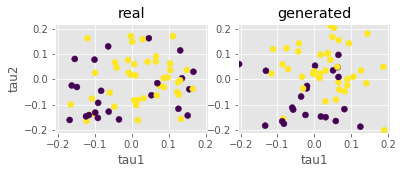

Wall time: 15min 22s


In [17]:
%%time

# Training the CGAN architecture

k_d = 1  # number of critic network updates per adversarial training step
learning_rate = 5e-5 # 5e-5
arguments = [rand_dim, nb_steps, batch_size, 
             k_d, k_g, critic_pre_train_steps, log_interval, learning_rate, base_n_count,
            data_dir, generator_model_path, discriminator_model_path, loss_pickle_path, show ]

adversarial_training_GAN(arguments, train, data_cols=data_cols, label_cols=label_cols ) # CGAN

# Generated Data

In [18]:
# Let's look at some of the generated data
# First create the networks locally and load the weights

import CGAN
import importlib
importlib.reload(CGAN) # For reloading after making changes
from CGAN import *

rand_dim = 100 
base_n_count = 30 
seed = 17

data_dim = len(data_cols)
label_dim = len(label_cols)
with_class = False
if label_dim > 0: with_class = True
np.random.seed(seed)

# define network models

generator_model, discriminator_model, combined_model = define_models_CGAN(rand_dim, data_dim, label_dim, base_n_count)
generator_model.load_weights('./cache/electricity/CGAN_generator_model_weights_step_50000.h5')


In [19]:
# Now generate some new data
test_size = 10000 

z = np.random.normal(size=(test_size, rand_dim))
if with_class:
    labels = data[label_cols]
    g_z = generator_model.predict([z, labels])
else:
    g_z = generator_model.predict(z)

In [20]:
real_samples = data
fake_samples = pd.DataFrame(g_z, columns=data_cols+label_cols)

real_samples.to_excel('./data/electricity/real.xlsx')
fake_samples.to_excel('./data/electricity/fake.xlsx')

In [3]:
real_samples = pd.read_excel('./data/electricity/real.xlsx')
fake_samples = pd.read_excel('./data/electricity/fake.xlsx')

# Correlation between variables of two datasets

## Pearson Correlation Index

In [4]:
pearson = real_samples.corrwith(fake_samples)
pearson.to_excel('./res.xlsx')
pearson

Unnamed: 0    1.000000
tau1          0.055268
tau2          0.147652
tau3          0.023672
tau4          0.044930
p1            0.000364
p2           -0.009743
p3            0.004786
p4           -0.000329
g1            0.045101
g2            0.010993
g3            0.094598
g4            0.003230
stab          0.690607
stabf         1.000000
dtype: float64

## Covariance

In [15]:
columnas = real_samples.columns.values
covarianza = []
for col in columnas:
    print(col + ":       " +  str(np.cov(real_samples[col], fake_samples[col])[0][1]))
    covarianza.append(np.cov(real_samples[col], fake_samples[col])[0][1])
    
pd.Series(covarianza).to_excel('./res.xlsx')
    

tau1:       0.005248101503759605
tau2:       0.016810605949850354
tau3:       0.0024827504478768477
tau4:       0.004048694183851522
p1:       3.953480525738425e-05
p2:       -0.0009685385759517389
p3:       0.0005989270391851273
p4:       -3.381808814364559e-05
g1:       0.004993680027872202
g2:       0.0010780604677885072
g3:       0.010635950200845663
g4:       0.0003028786127934501
stab:       0.06354534431524758
stabf:       0.23097909790979107


## Spearman's Correlation

In [17]:
from scipy.stats import spearmanr
columnas = real_samples.columns.values
spearman = []
for col in columnas:
    spr, _ = spearmanr(real_samples[col], fake_samples[col])
    spearman.append(spr)
    print(col + ":       " + str(spr) )
    
pd.Series(spearman).to_excel('./res.xlsx')

tau1:       0.05527516613491749
tau2:       0.1473101977175439
tau3:       0.028282156290991255
tau4:       0.048593266517932665
p1:       0.0010348505443609237
p2:       -0.009872393972753555
p3:       0.0026665186346731856
p4:       -0.0010343928943532385
g1:       0.044054965640549656
g2:       0.009133957087339571
g3:       0.09709107595149331
g4:       0.006330831957327312
stab:       0.6857439344114965
stabf:       1.0


# XGBoost

## CV with real data

In [15]:
# Classification results with real data
xgbo_cv(data[data_cols], data[label_cols].values.ravel())

Accuracy XGBoost CV:  0.9998000000000001
F1-Score XGBoost CV:  0.999843260164021
ROC AUC XGBoost CV:  0.9999154600876358


## CV with generated data

In [7]:
# Generated data
X = fake_samples.drop(columns=["stabf"])
y = fake_samples["stabf"]
xgbo_cv(X, y.values.ravel())

Accuracy XGBoost CV:  0.9748000000000001
F1-Score XGBoost CV:  0.980319214991274
ROC AUC XGBoost CV:  0.9960626699457906


## CV with the two datasets joined

In [26]:
from sklearn.utils import shuffle
data = pd.concat([real_samples, fake_samples])
data = shuffle(data)
data.to_excel('./data/electricity/real_fake.xlsx')

In [28]:
xgbo_cv(data.drop(columns=['stabf']), data.stabf.values.ravel())

Accuracy XGBoost CV:  0.9866999999999999
F1-Score XGBoost CV:  0.9895822945775947
ROC AUC XGBoost CV:  0.9985849306794368
